In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pprint as pprint
%matplotlib inline
pd.set_option('display.max_rows',None)

In [2]:
df=pd.read_csv('Home_price_Train.csv')

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Before identifying missing values or zeros in the data, let's replace all the "  " to NaN for all the object columns

for col in df.select_dtypes(include='object').columns:
    df[col].replace(r'^\s*$', np.nan, regex=True, inplace=True)
    df[col].replace("NaN", np.nan, regex=True, inplace=True)

###### Identify Columns with values are nulls
###### Identify Columns with values are 0's
###### Identify Columns with values as count of unique values and remove columns with only 1 value because we don't need it

In [5]:
missingColumns=((df.isnull().sum()/len(df))*100).to_dict()
zeroColumns=(((df==0).sum()/len(df))*100).to_dict()
featureValueCounts=dict(df.nunique().sort_values(ascending=False))

In [6]:
def dropMissingColumns(featureValueCounts,missingColumns,zeroColumns):
    l=[]
    l.append('Id')
    # Remove columns whose missing values % is >=10%
    for key,value in missingColumns.items():
        if value>=10:
            l.append(key)
 
    # Remove columns whose missing values % is >=10%
    for key,value in zeroColumns.items():
        if value>=10:
            l.append(key)
            
    # Remove Columns which contains only one value
    for key,value in featureValueCounts.items():
        if value==1:
            l.append(key)
        
    return l


In [7]:
dropColumns=dropMissingColumns(featureValueCounts,missingColumns,zeroColumns)
print(dropColumns)
df2=df.drop(columns=dropColumns,axis=1)

['Id', 'LotFrontage', 'Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'HalfBath', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']


In [8]:
df2.head()

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,...,2,548,TA,TA,Y,2,2008,WD,Normal,208500
1,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,...,2,460,TA,TA,Y,5,2007,WD,Normal,181500
2,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,...,2,608,TA,TA,Y,9,2008,WD,Normal,223500
3,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,...,3,642,TA,TA,Y,2,2006,WD,Abnorml,140000
4,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,...,3,836,TA,TA,Y,12,2008,WD,Normal,250000


<b><span style="color: orange;">**Observation :**</span></b>
No Duplicate Records



In [9]:
df2.shape

(1460, 57)

In [10]:
pd.set_option('display.max_columns',None)

In [11]:
df2.loc[df2.isnull().any(axis=1)]

,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,90,RL,10791,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,TA,TA,Slab,NaN,NaN,NaN,NaN,NaN,0,0,GasA,TA,Y,SBrkr,1296,1296,2,2,2,TA,6,Typ,CarPort,1967.0,Unf,2,516,TA,TA,Y,10,2006,WD,Normal,90000
39,90,RL,6040,Pave,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,TA,TA,PConc,NaN,NaN,NaN,NaN,NaN,0,0,GasA,TA,N,FuseP,1152,1152,2,2,2,Fa,6,Typ,NaN,NaN,NaN,0,0,NaN,NaN,N,6,2008,WD,AdjLand,82000
48,190,RM,4456,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,4,5,1920,2008,Gable,CompShg,MetalSd,MetalSd,TA,TA,BrkTil,TA,TA,No,Unf,Unf,736,736,GasA,Gd,Y,SBrkr,736,1452,2,2,3,TA,8,Typ,NaN,NaN,NaN,0,0,NaN,NaN,N,6,2009,New,Partial,113000
78,90,RL,10778,Pave,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1968,1968,Hip,CompShg,HdBoard,HdBoard,TA,TA,CBlock,TA,TA,No,Unf,Unf,1768,1768,GasA,TA,N,SBrkr,1768,1768,2,4,2,TA,8,Typ,NaN,NaN,NaN,0,0,NaN,NaN,Y,4,2010,WD,Normal,136500
88,50,C (all),8470,Pave,IR1,Lvl,AllPub,Corner,Gtl,IDOTRR,Feedr,Feedr,1Fam,1.5Fin,3,2,1915,1982,Hip,CompShg,Plywood,Plywood,Fa,Fa,CBlock,TA,Fa,No,Unf,Unf,1013,1013,GasA,TA,N,SBrkr,1013,1526,1,2,1,Fa,6,Typ,NaN,NaN,NaN,0,0,NaN,NaN,N,10,2009,ConLD,Abnorml,85000
89,20,RL,8070,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,4,5,1994,1995,Gable,CompShg,VinylSd,VinylSd,TA,TA,PConc,Gd,TA,No,GLQ,Unf,402,990,GasA,Ex,Y,SBrkr,990,990,1,3,1,TA,5,Typ,NaN,NaN,NaN,0,0,NaN,NaN,Y,8,2007,WD,Normal,123600
90,20,RL,7200,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1950,1950,Gable,CompShg,BrkFace,Wd Sdng,TA,TA,Slab,NaN,NaN,NaN,NaN,NaN,0,0,GasA,TA,Y,FuseA,1040,1040,1,2,1,TA,4,Typ,Detchd,1950.0,Unf,2,420,TA,TA,Y,7,2006,WD,Normal,109900
99,20,RL,9320,Pave,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1959,1959,Gable,CompShg,Plywood,Plywood,TA,TA,CBlock,TA,TA,No,ALQ,Unf,381,950,GasA,Fa,Y,SBrkr,1225,1225,1,3,1,TA,6,Typ,NaN,NaN,NaN,0,0,NaN,NaN,Y,1,2010,WD,Normal,128950
102,90,RL,7018,Pave,Reg,Bnk,AllPub,Inside,Gtl,SawyerW,Norm,Norm,Duplex,1Story,5,5,1979,1979,Gable,CompShg,HdBoard,HdBoard,TA,Fa,Slab,NaN,NaN,NaN,NaN,NaN,0,0,GasA,TA,Y,SBrkr,1535,1535,2,4,2,TA,8,Typ,Attchd,1979.0,Unf,2,410,TA,TA,Y,6,2009,WD,Alloca,118964
108,50,RM,8500,Pave,Reg,Lvl,AllPub,Corner,Gtl,IDOTRR,Artery,Norm,1Fam,1.5Fin,5,7,1919,2005,Gable,CompShg,CemntBd,CmentBd,TA,TA,CBlock,TA,TA,No,Unf,Unf,793,793,GasW,TA,N,FuseF,997,1517,2,3,1,Fa,7,Typ,NaN,NaN,NaN,0,0,NaN,NaN,N,8,2007,WD,Normal,115000


In [12]:
len(df2.loc[df2.isnull().any(axis=1)])

114

In [13]:
# Drop empty rows

df3=df2.dropna(how='any')
df3.shape

(1346, 57)

In [14]:
df3.loc[:,'GarageYrBlt']=df3['GarageYrBlt'].astype('int64') # to avoid SettingWithCopy Warning in Python dataframe

### Exploratory Data Analysis

In [15]:
# Identify Numeric Columns and Object columns
objectColumns=[col for col in df2.columns if df2[col].dtype=='object']
numericColumns=[col for col in df2.columns if df2[col].dtype!='object']

In [16]:
df2[numericColumns].corr()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageYrBlt,GarageCars,GarageArea,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.139781,0.032628,-0.059316,0.027850,0.040581,-0.140759,-0.238518,-0.251758,0.074853,0.131608,-0.023438,0.281721,0.040380,0.085072,-0.040110,-0.098672,-0.013585,-0.021407,-0.084284
LotArea,-0.139781,1.000000,0.105806,-0.005636,0.014228,0.013788,-0.002618,0.260833,0.299475,0.263116,0.126031,0.119690,-0.017784,0.190015,-0.024947,0.154871,0.180403,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.105806,1.000000,-0.091932,0.572323,0.550684,0.308159,0.537808,0.476224,0.593007,0.550600,0.101676,-0.183882,0.427452,0.547766,0.600671,0.562022,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.136841,-0.171098,-0.144203,-0.079686,-0.194149,0.012980,-0.087001,-0.057583,-0.324297,-0.185758,-0.151521,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.014228,0.572323,-0.375983,1.000000,0.592855,0.149040,0.391452,0.281986,0.199010,0.468271,-0.070651,-0.174800,0.095589,0.825667,0.537850,0.478954,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.013788,0.550684,0.073741,0.592855,1.000000,0.181133,0.291066,0.240379,0.287389,0.439046,-0.040581,-0.149598,0.191740,0.642277,0.420622,0.371600,0.021490,0.035743,0.507101
BsmtUnfSF,-0.140759,-0.002618,0.308159,-0.136841,0.149040,0.181133,1.000000,0.415360,0.317987,0.240257,0.288886,0.166643,0.030086,0.250647,0.190708,0.214175,0.183303,0.034888,-0.041258,0.214479
TotalBsmtSF,-0.238518,0.260833,0.537808,-0.171098,0.391452,0.291066,0.415360,1.000000,0.819530,0.454868,0.323722,0.050450,-0.068901,0.285573,0.322445,0.434585,0.486665,0.013196,-0.014969,0.613581
1stFlrSF,-0.251758,0.299475,0.476224,-0.144203,0.281986,0.240379,0.317987,0.819530,1.000000,0.566024,0.380637,0.127401,0.068101,0.409516,0.233449,0.439317,0.489782,0.031372,-0.013604,0.605852
GrLivArea,0.074853,0.263116,0.593007,-0.079686,0.199010,0.287389,0.240257,0.454868,0.566024,1.000000,0.630012,0.521270,0.100063,0.825489,0.231197,0.467247,0.468997,0.050240,-0.036526,0.708624


##### Idenfity the distribution of all the numerical variables

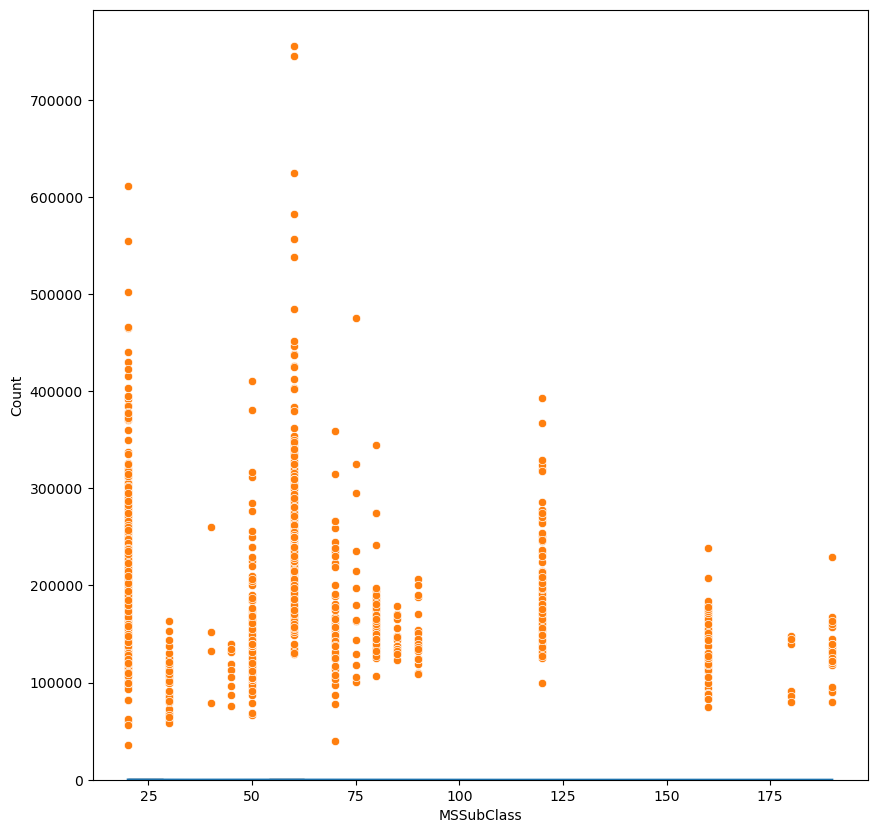

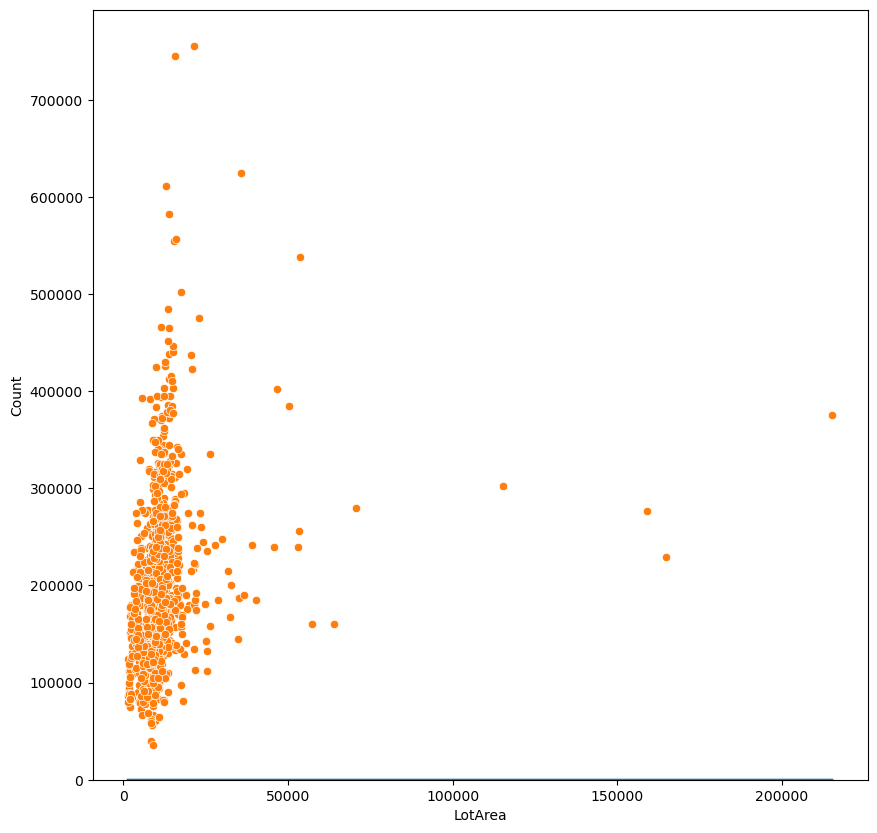

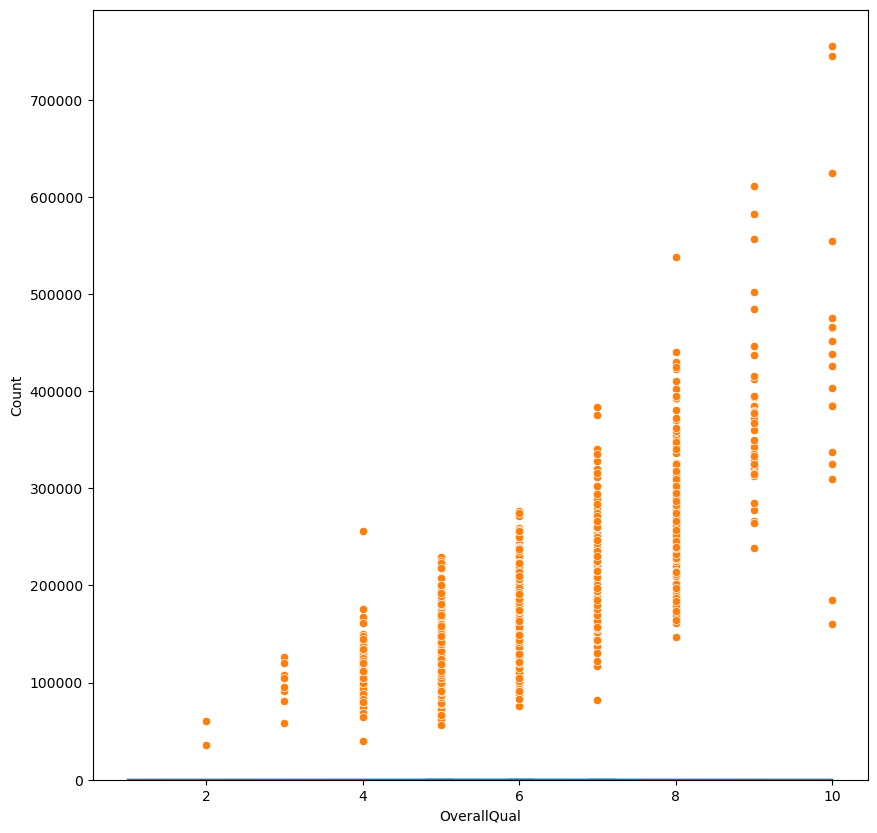

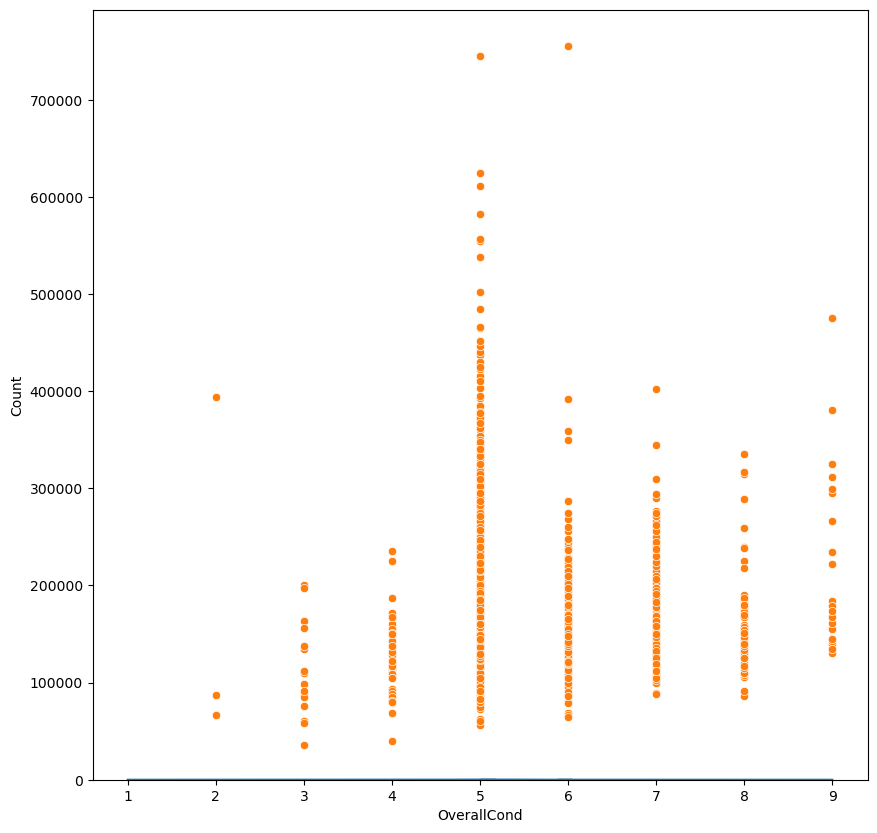

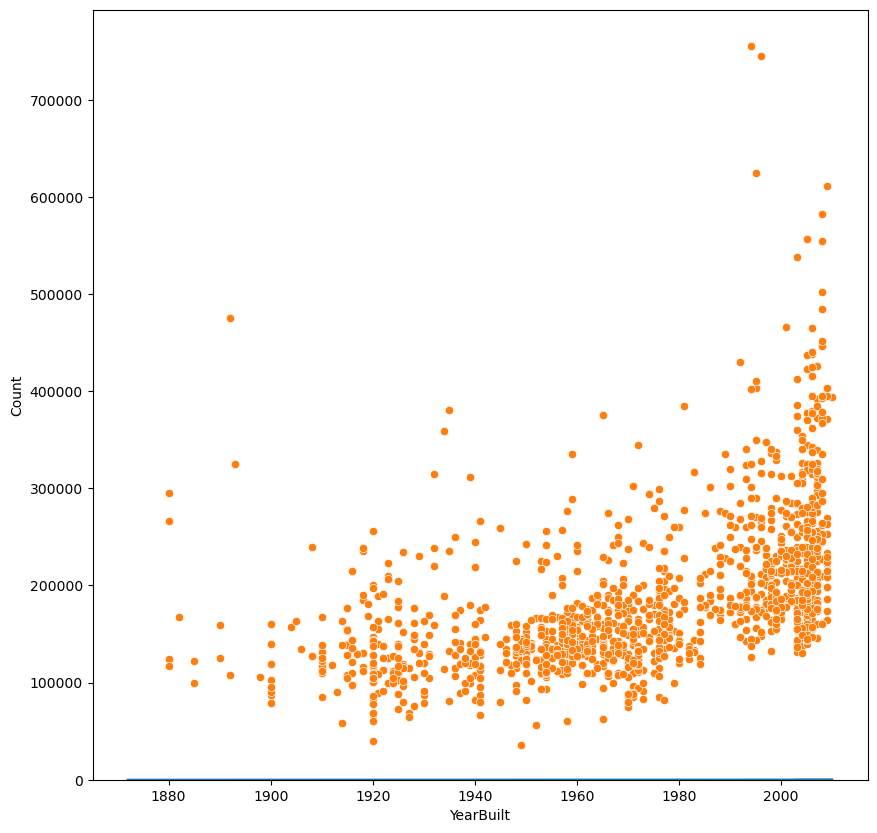

...

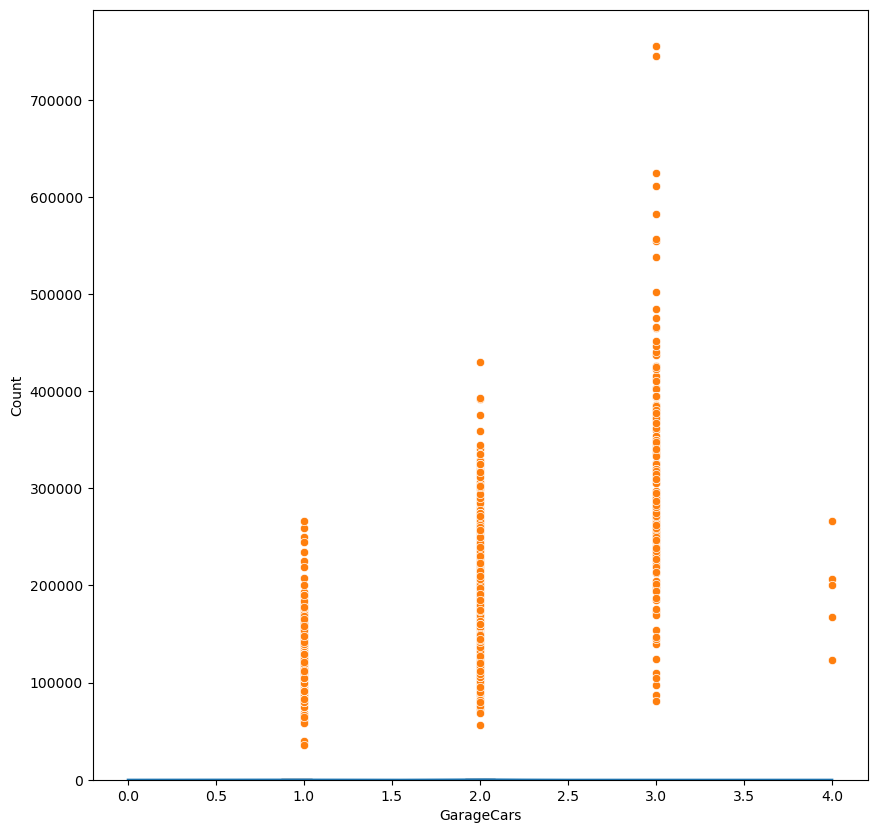

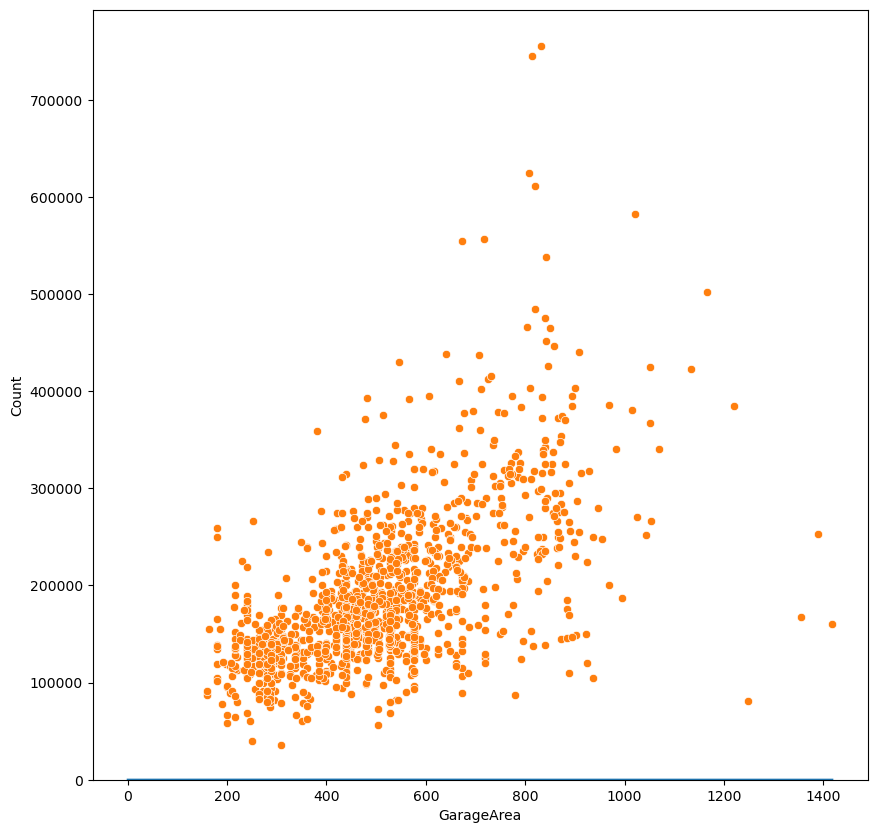

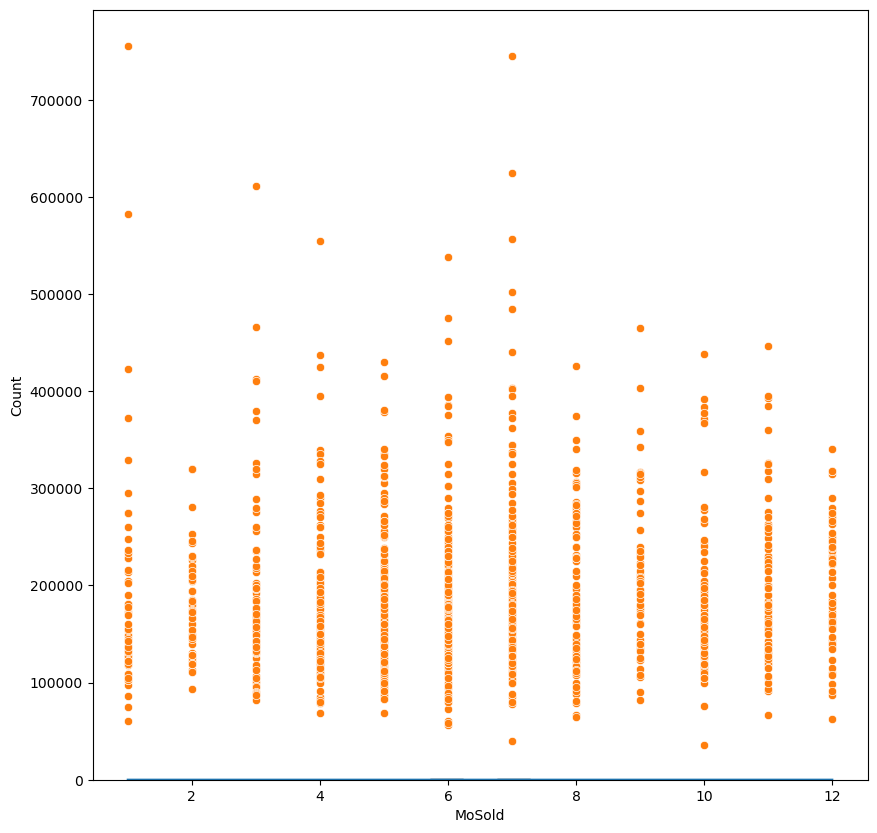

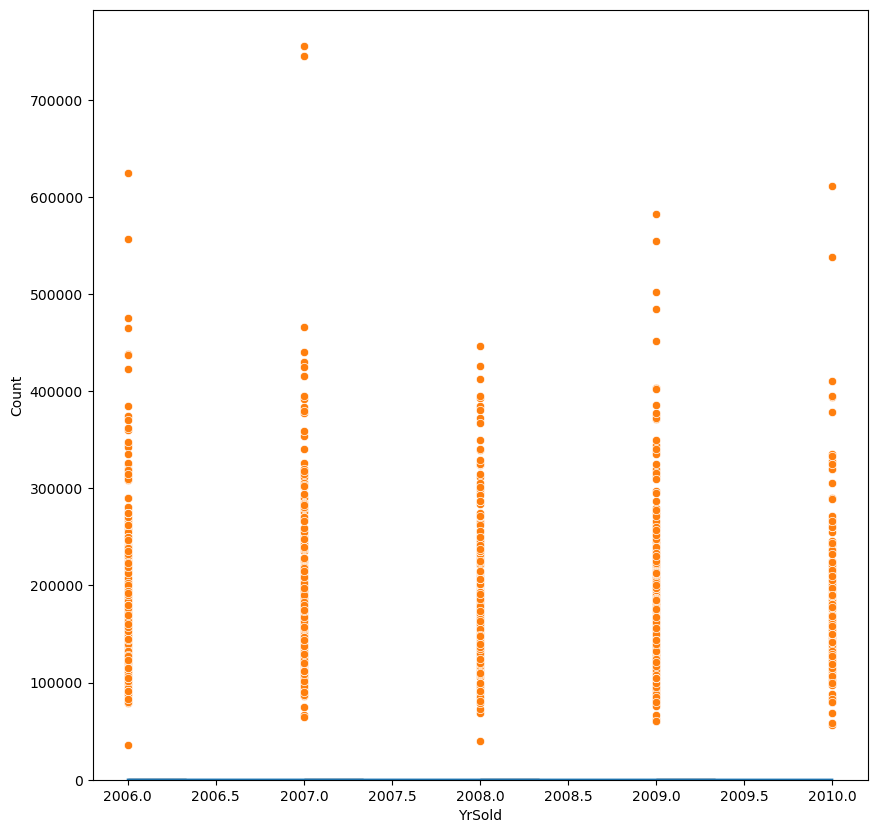

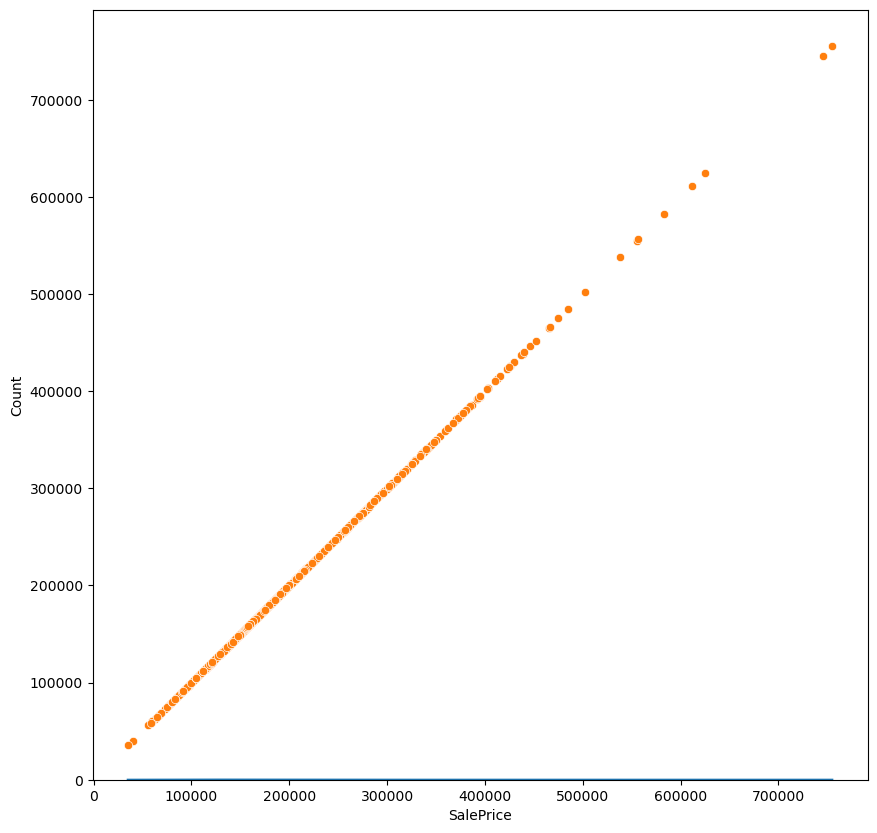

In [17]:
for feature in numericColumns:
    plt.figure(figsize=(10,10))
    sns.histplot(df[feature],kde=True)
    sns.scatterplot(x=df3[feature],y=df3['SalePrice'])
    plt.xlabel(feature)
    plt.show()

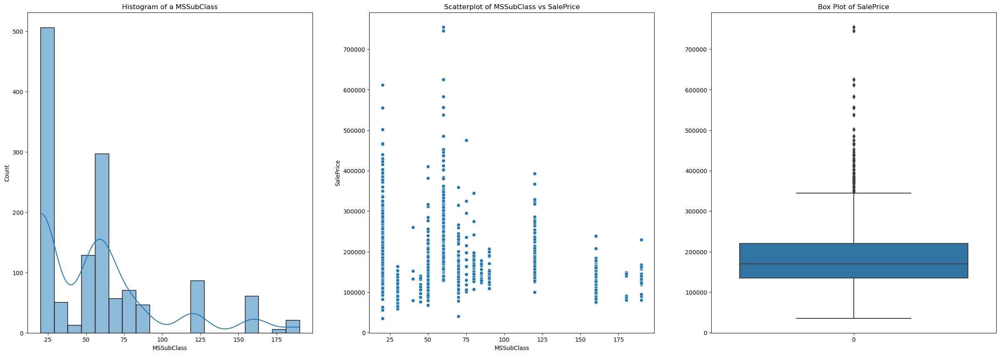

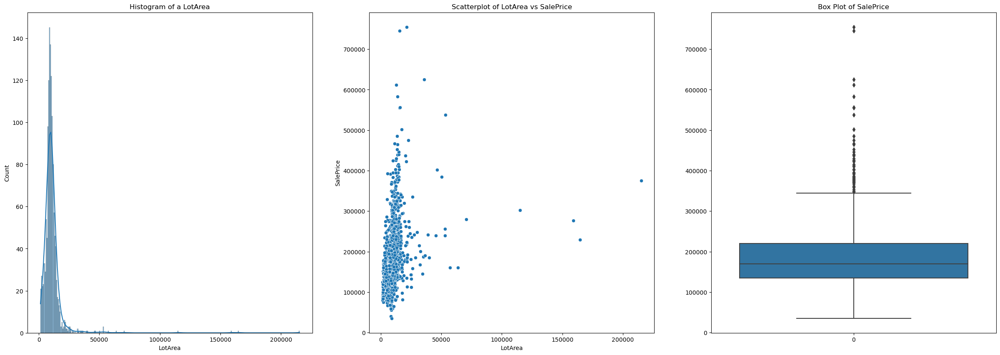

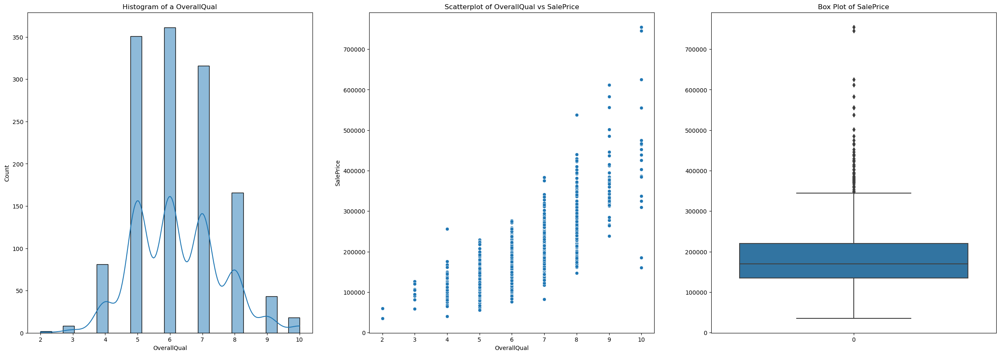

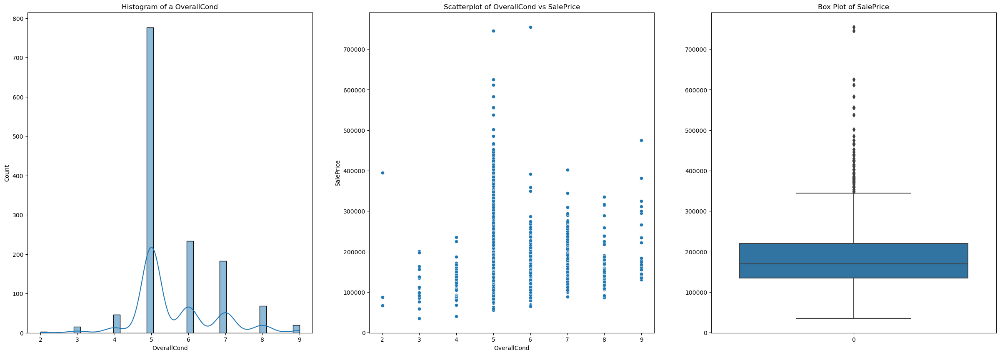

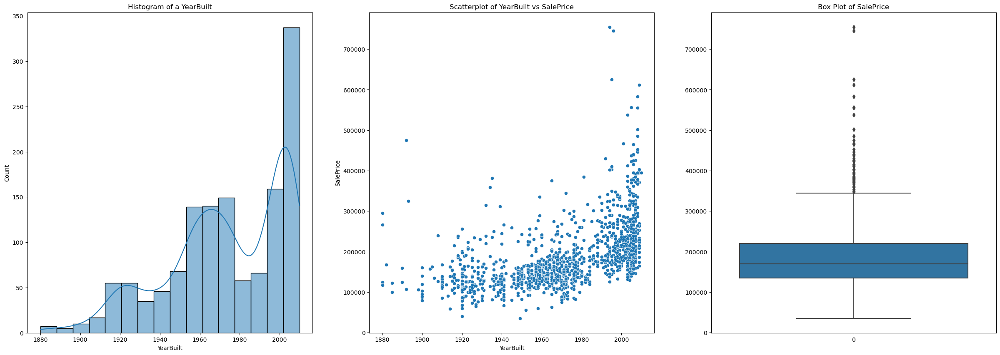

...

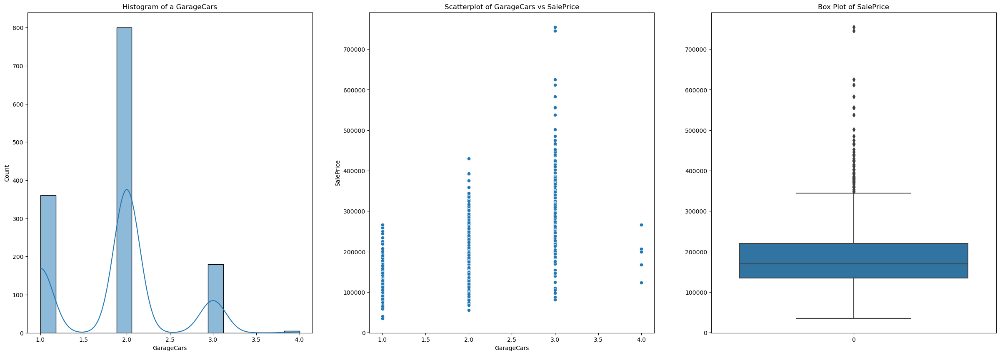

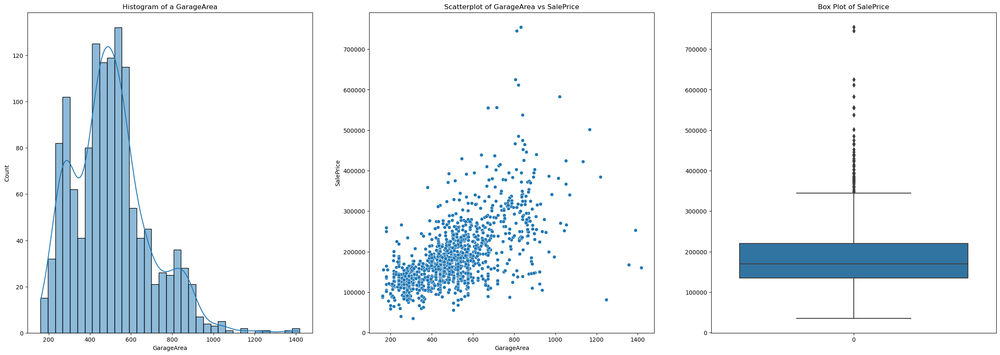

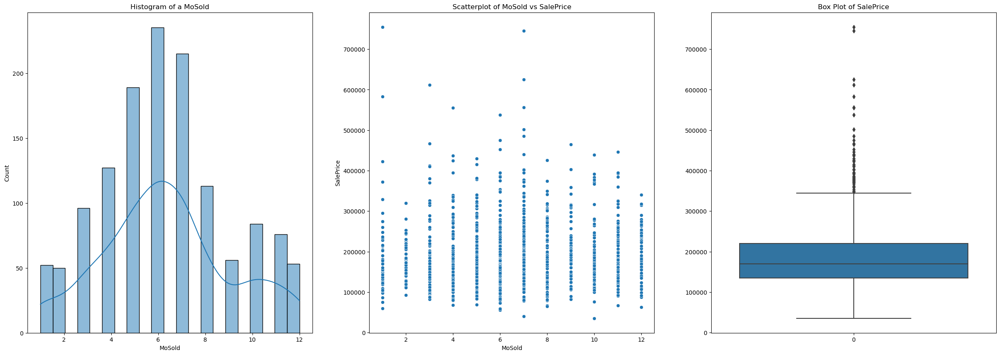

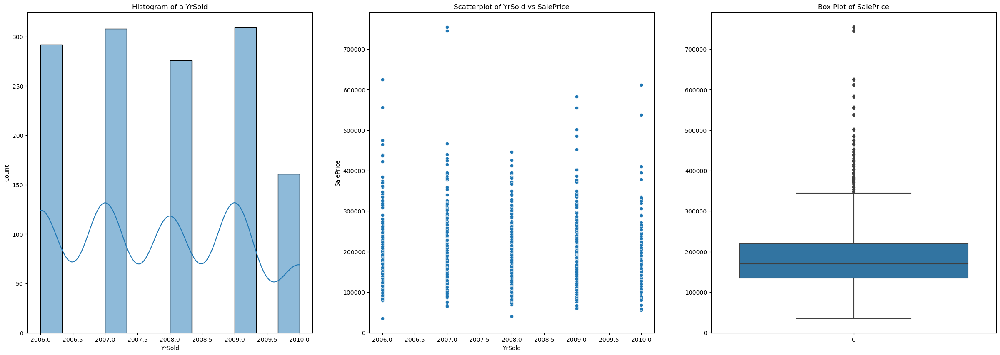

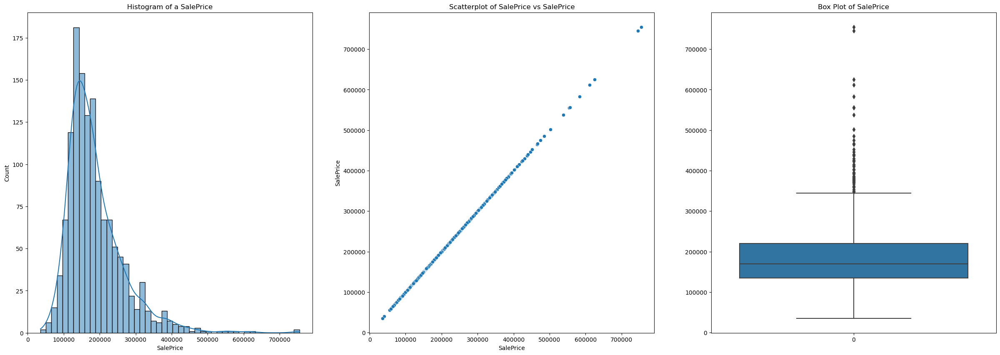

In [18]:
for col in numericColumns:
    fig,ax=plt.subplots(1,3,figsize=(30,10))
    
    sns.histplot(df3[col],kde=True,ax=ax[0])
    ax[0].set_title(f'Histogram of a {col}')
    ax[0].set_xlabel(col)
    
    
    sns.scatterplot(data=df3,x=col,y='SalePrice',ax=ax[1])
    ax[1].set_title(f'Scatterplot of {col} vs SalePrice')
    ax[1].set_ylabel('SalePrice')
    ax[1].set_xlabel(col)
    
    sns.boxplot(df3['SalePrice'])
    ax[2].set_title('Box Plot of SalePrice')
    
    plt.show()

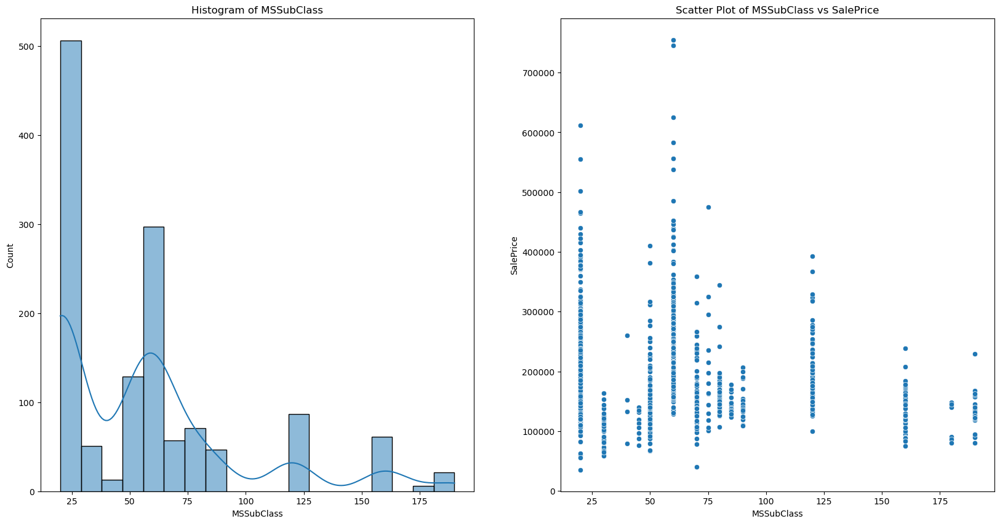

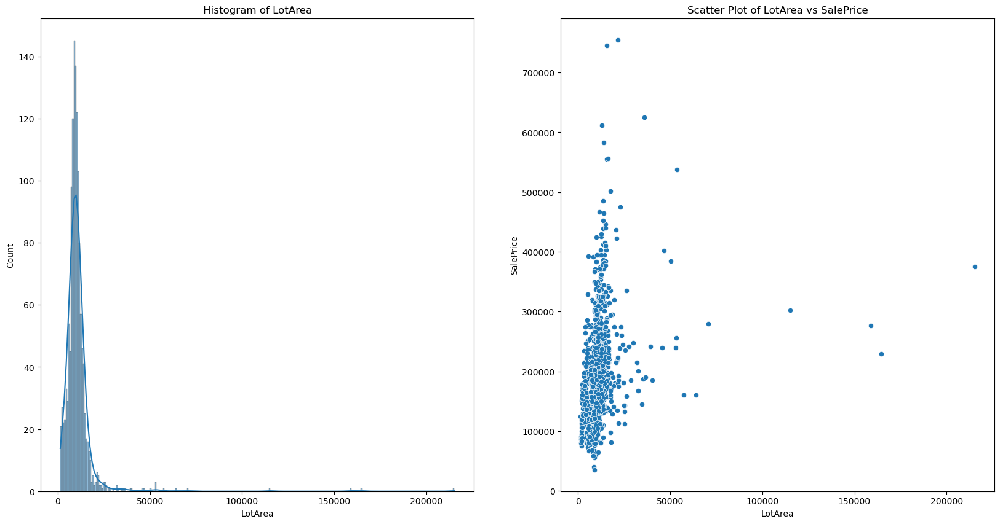

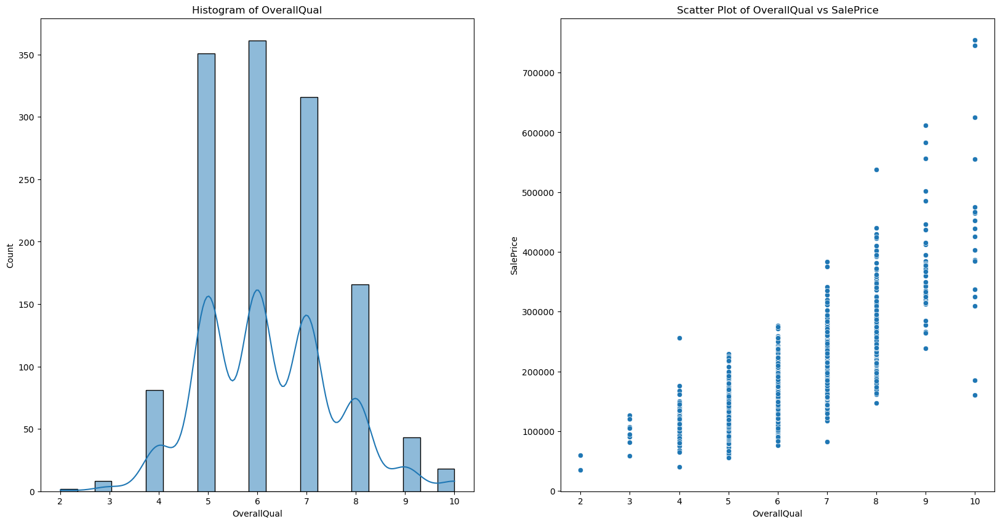

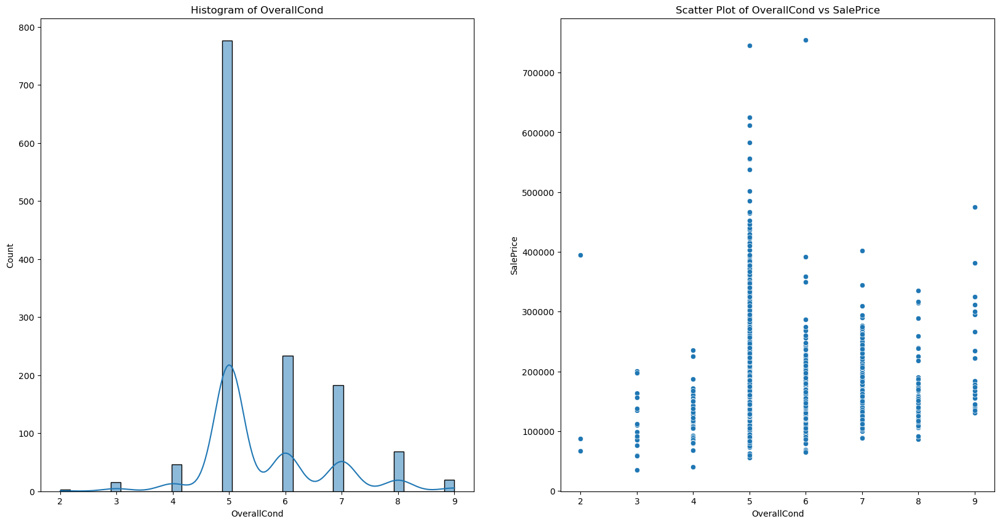

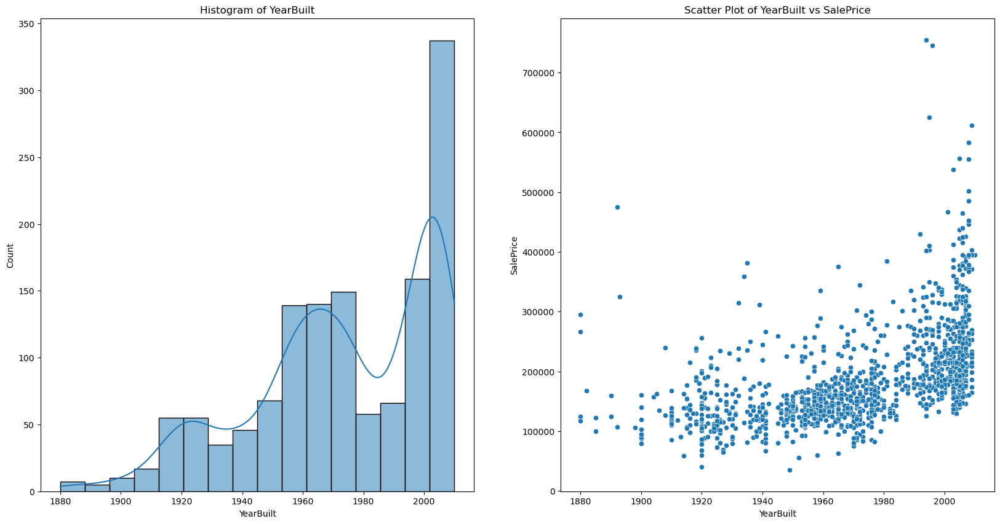

...

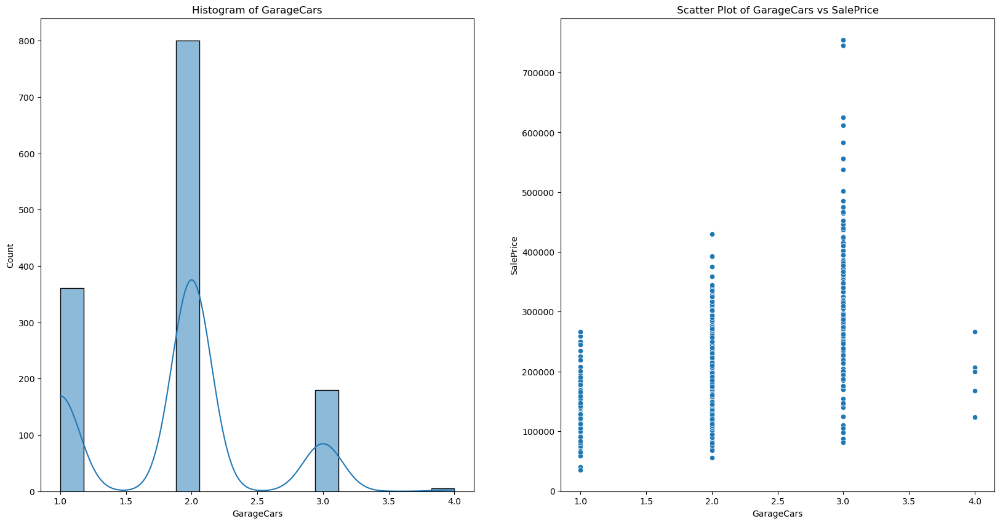

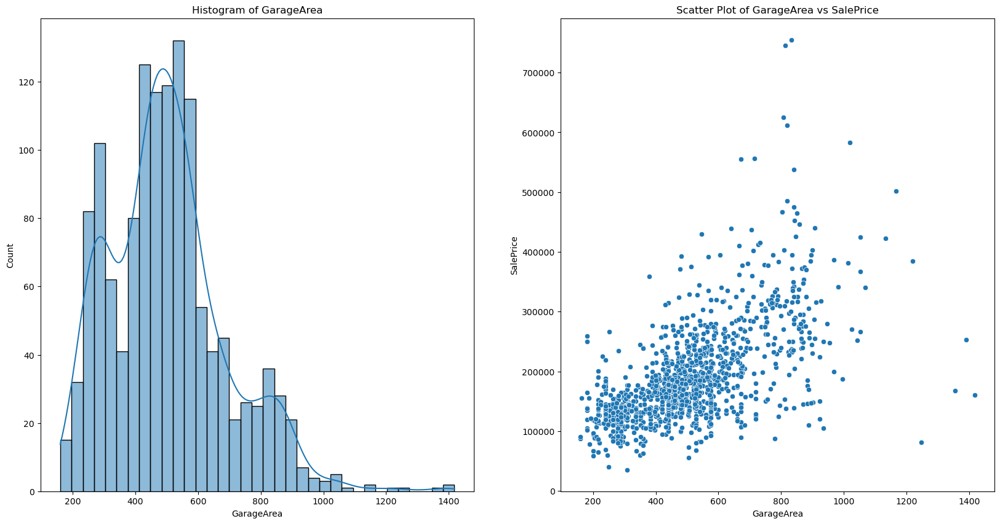

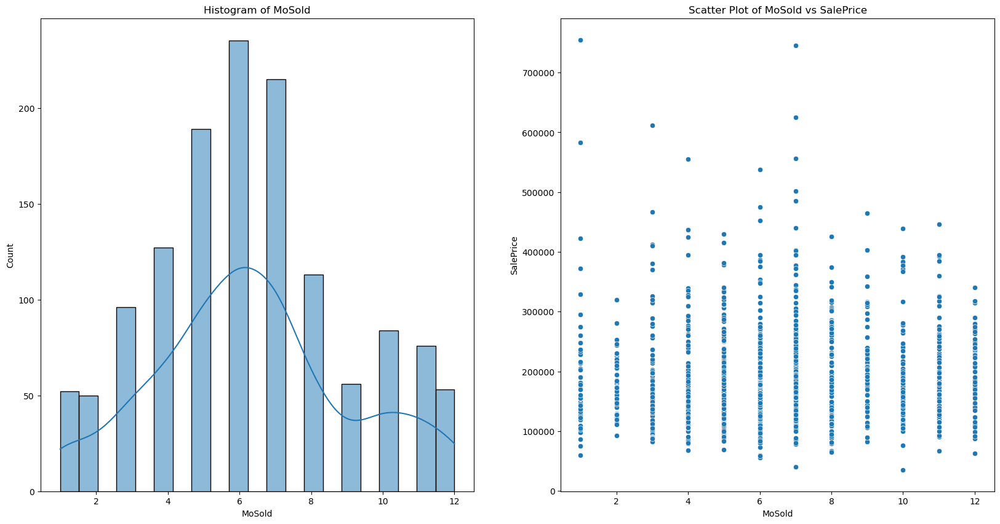

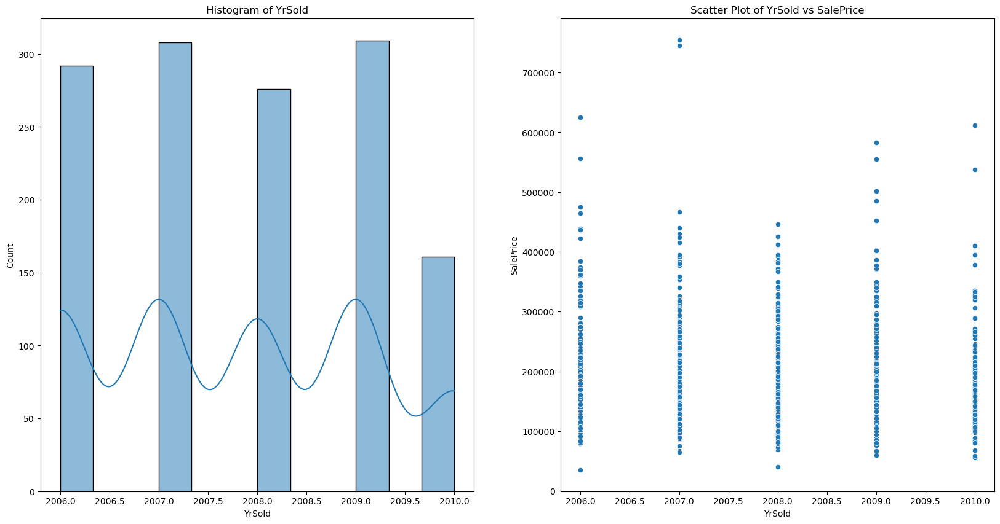

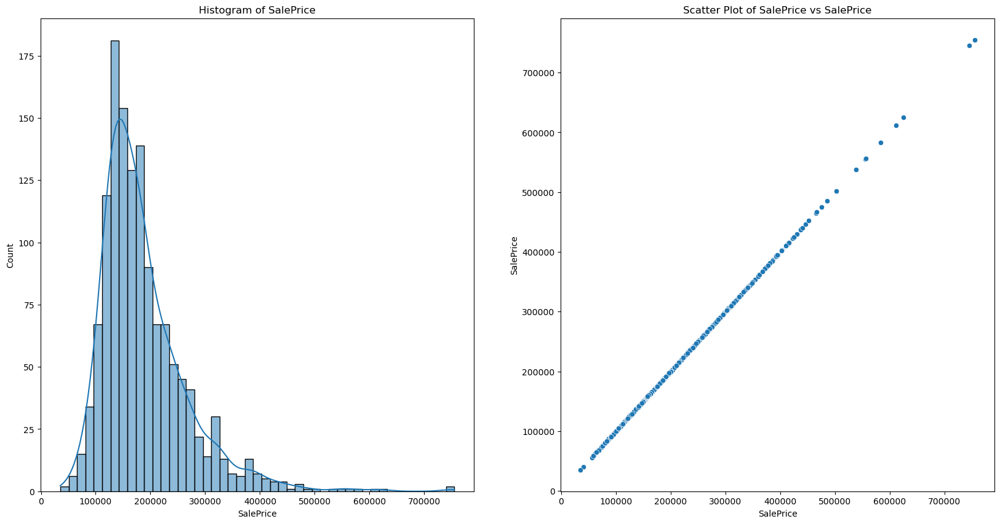

In [19]:
for feature in numericColumns:
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))  # Create 1 row and 2 columns of subplots

    # Plot histogram
    sns.histplot(df3[feature], kde=True, ax=axes[0])
    axes[0].set_title(f'Histogram of {feature}')
    axes[0].set_xlabel(feature)

    # Plot scatter plot
    sns.scatterplot(data=df3, x=feature, y='SalePrice', ax=axes[1])
    axes[1].set_title(f'Scatter Plot of {feature} vs SalePrice')
    axes[1].set_xlabel(feature)
    axes[1].set_ylabel('SalePrice')

    plt.show()

In [20]:
# Outlier Removal Based on IQR methodology
# if the data is normally distributed then use Z Score to remove the outliers
# if the data is skewed then use IQR
df4=df3

for col in numericColumns:
    Q1=df4[col].quantile(0.25)
    Q3=df4[col].quantile(0.75)
    
    IQR=Q3-Q1
    
    lowerbound = Q1-1.5*IQR
    upperbound = Q3+1.5*IQR
    df4=df4[(df4[col]>=lowerbound) & (df4[col]<=upperbound)]


#### Since there are so many different type of categorical variables let's understand how their relationship is with the output feature

##### Since there are different type of categorical variables, let's do label encoding for the variable with two categories and Target encoding for multi categories

In [21]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, TargetEncoder

#### Converting Categorical features into numerical features

In [22]:
ohe=OneHotEncoder()
lbe=LabelEncoder()
encoded_dfs=[]
for col in df4.select_dtypes(include='object').columns:
    if df4[col].nunique()==2:
        
        encoded=ohe.fit_transform(df4[[col]]).toarray().astype('int64')
        encodedDF=pd.DataFrame(encoded,columns=ohe.get_feature_names_out())
        encoded_dfs.append(encodedDF)
        print(len(encodedDF))
        df4.drop(columns=[col],axis=1,inplace=True)
        
    else:
#         df4[col]=lbe.fit_transform(df4[col]).tolist() # label encoding for categorical variables with more than 2 values
        feature_dict=df4.groupby(col)['SalePrice'].median().astype('int64')
        df4[col]=df4[col].map(feature_dict)
        

df4.reset_index(drop=True,inplace=True)
df4=pd.concat([df4]+encoded_dfs,axis=1).reset_index(drop=True)
print(len(df4))

        

942
942
942
942


##### Lets Analyze the distribution of all the variables and transform them accordingly

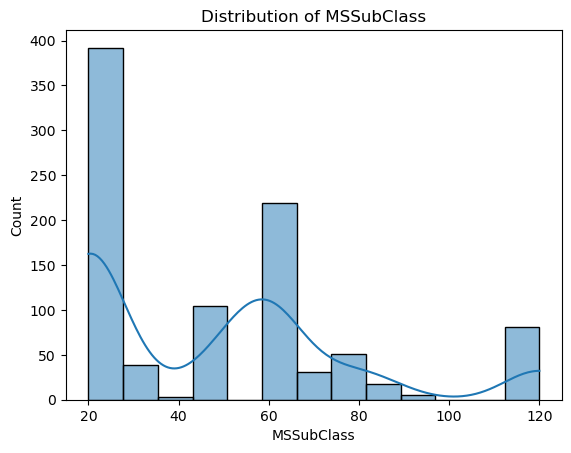

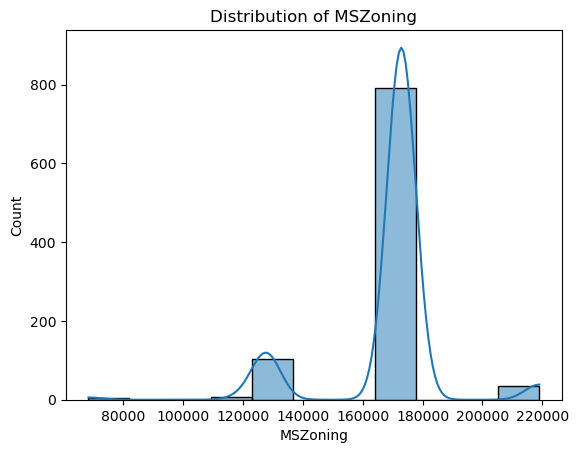

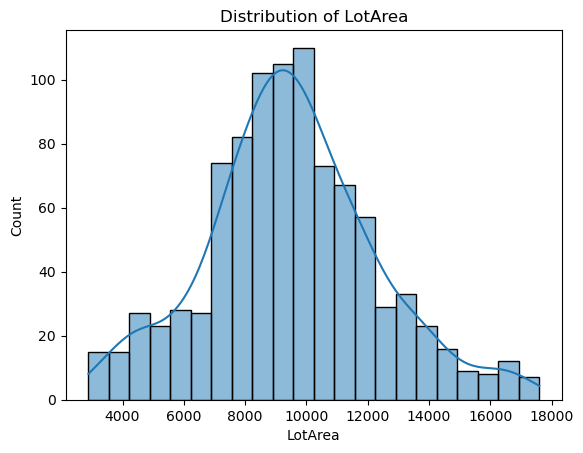

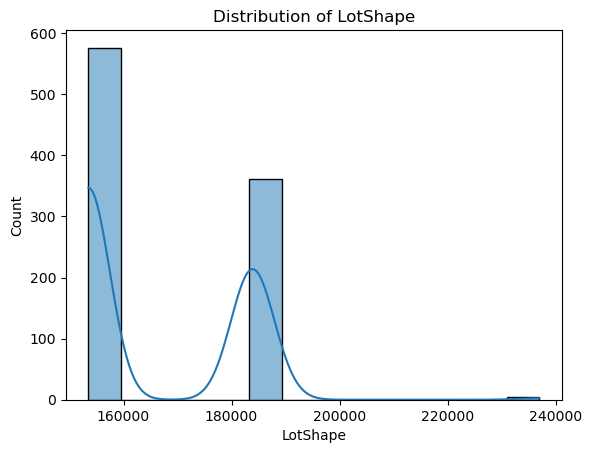

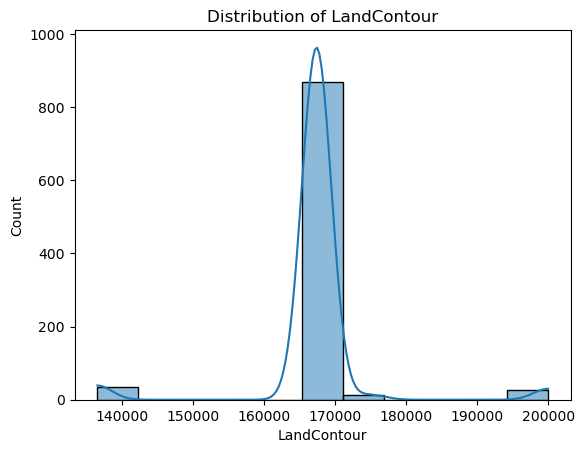

...

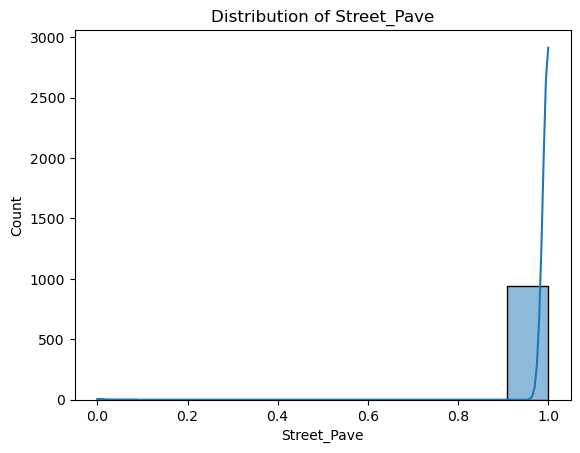

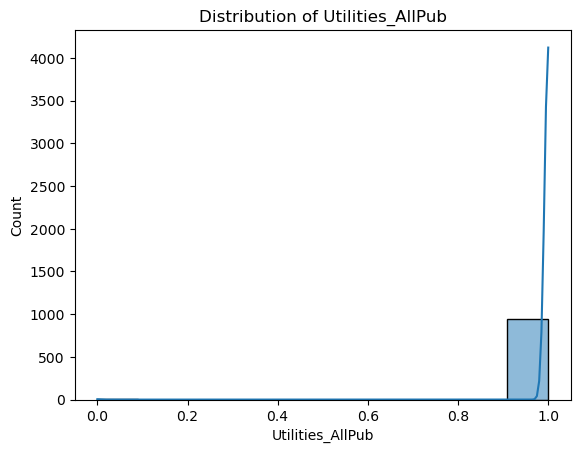

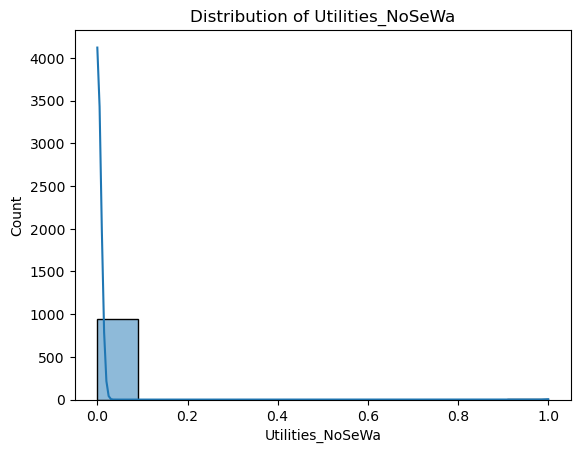

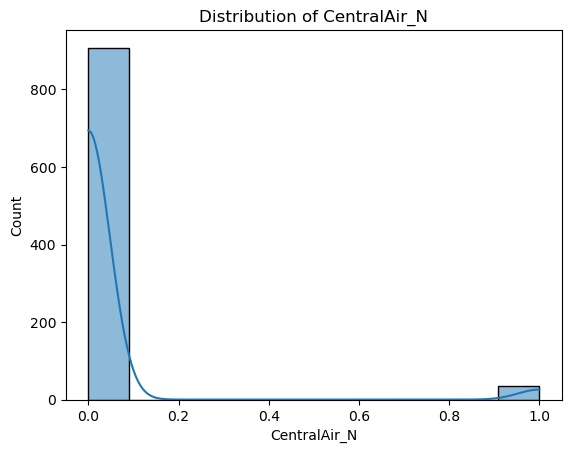

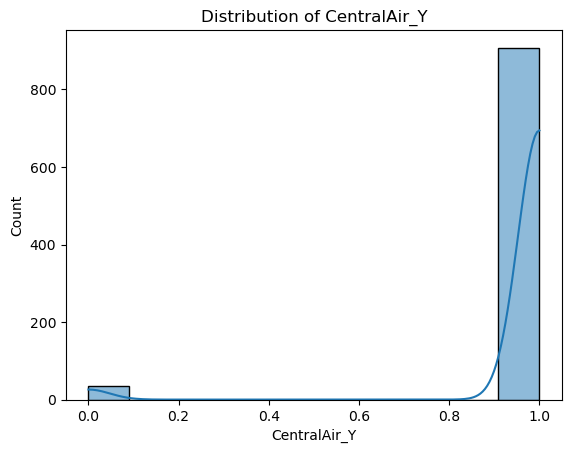

In [23]:
for col in df4:
    sns.histplot(df4[col],kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

In [24]:
df4.head()

,MSSubClass,MSZoning,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,Electrical,1stFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Street_Grvl,Street_Pave,Utilities_AllPub,Utilities_NoSeWa,CentralAir_N,CentralAir_Y
0,60,172892,8450,153500,167370,165500,167000,195200,171000,167000,165000,197900,7,5,2003,2003,169500,166000,197900,199900,213000,171000,200000,193250,167240,159000,207000,171000,150,856,167000,192250,172400,856,1710,2,3,1,199950,8,169990,180000,2003.0,188375,2,548,168750,168750,169745,2,2008,164000,165000,208500,0,1,1,0,0,1
1,60,172892,11250,183750,167370,165500,167000,195200,171000,167000,165000,197900,7,5,2001,2002,169500,166000,197900,199900,213000,171000,200000,193250,167240,185500,207000,171000,434,920,167000,192250,172400,920,1786,2,3,1,199950,6,169990,180000,2001.0,188375,2,608,168750,168750,169745,9,2008,164000,165000,223500,0,1,1,0,0,1
2,70,172892,9550,183750,167370,161000,167000,177000,171000,167000,165000,197900,7,5,1915,1970,169500,166000,138943,135225,143000,171000,127750,137000,178000,159000,149000,171000,540,756,167000,157000,172400,961,1717,1,3,1,199950,7,169990,128000,1998.0,134500,3,642,168750,168750,169745,2,2006,164000,139000,140000,0,1,1,0,0,1
3,60,172892,14260,183750,167370,165000,167000,268895,171000,167000,165000,197900,8,5,2000,2000,169500,166000,197900,199900,213000,171000,200000,193250,167240,184500,207000,171000,490,1145,167000,192250,172400,1145,2198,2,4,1,199950,9,169990,180000,2000.0,188375,3,836,168750,168750,169745,12,2008,164000,165000,250000,0,1,1,0,0,1
4,50,172892,14115,183750,167370,165500,167000,161000,171000,167000,165000,134000,5,5,1993,1995,169500,166000,197900,199900,143000,171000,164000,193250,167240,159000,207000,171000,64,796,167000,192250,172400,796,1362,1,1,1,140000,5,169990,180000,1993.0,134500,2,480,168750,168750,169745,10,2009,164000,165000,143000,0,1,1,0,0,1


#### Let's Apply transformation to remove skeweness in the data

#### All the columns has postive values only, so let's apply box-cox transformation

In [25]:
from scipy.stats import boxcox

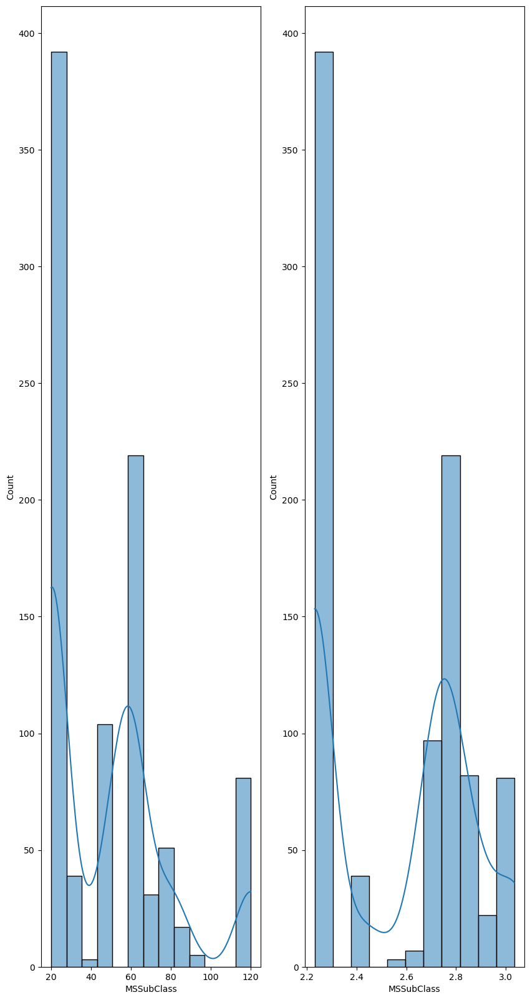

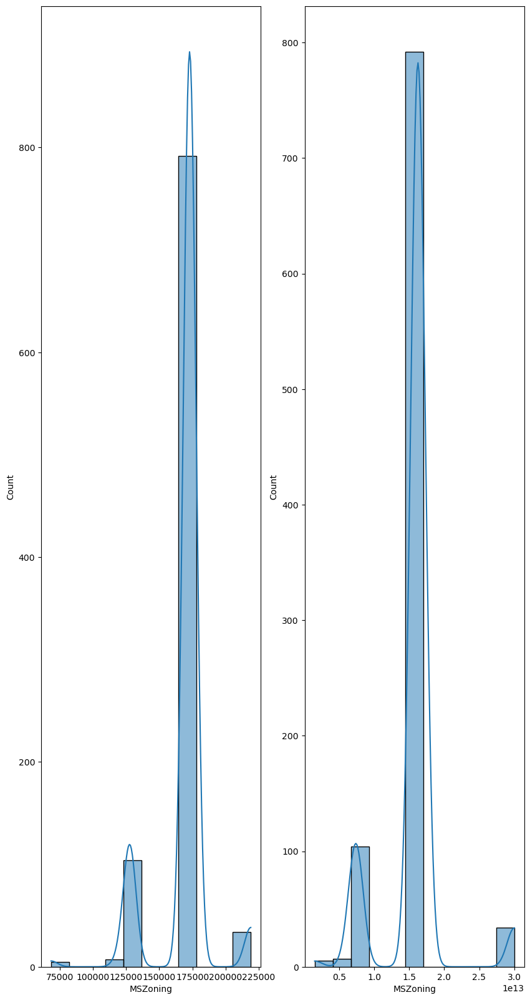

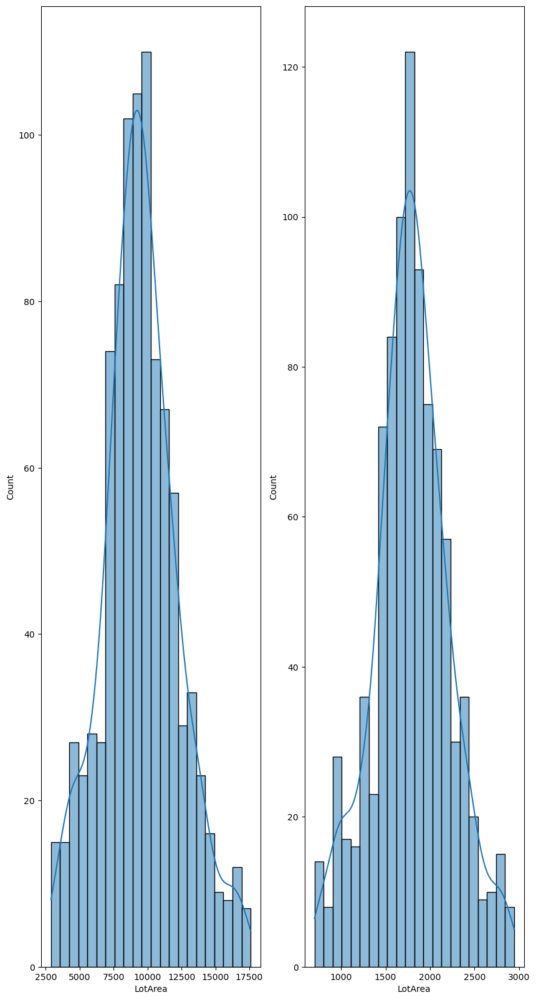

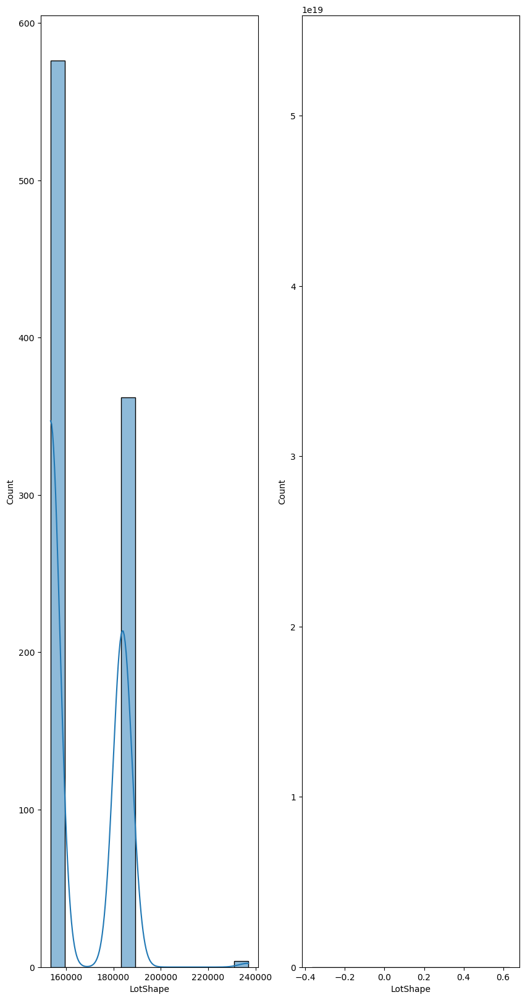

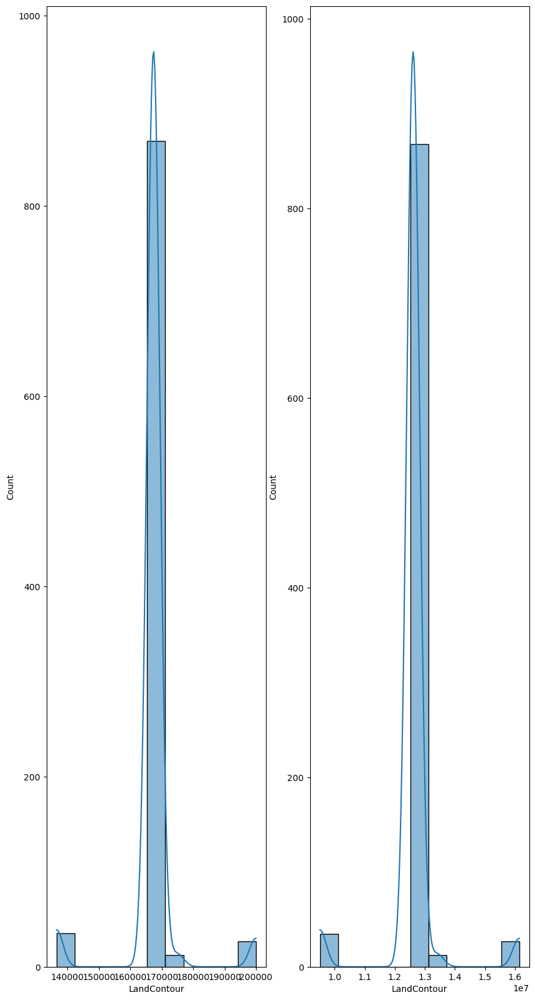

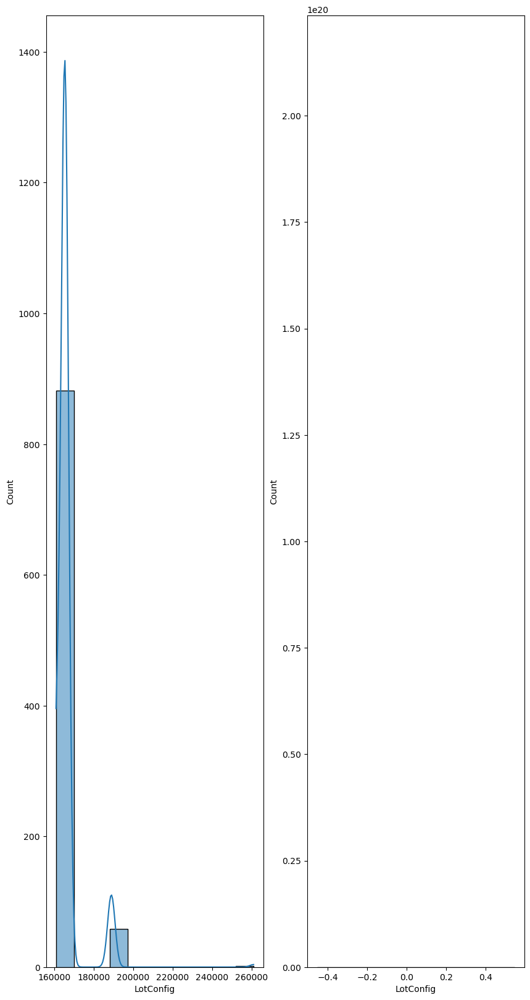

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar multiply
  tmp2 = (x - v) * (fx - fw)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


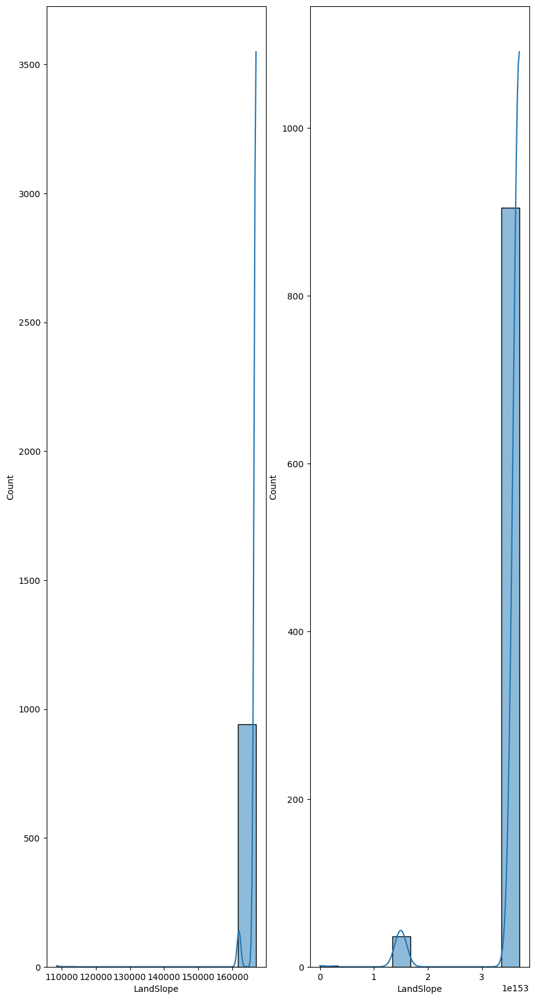

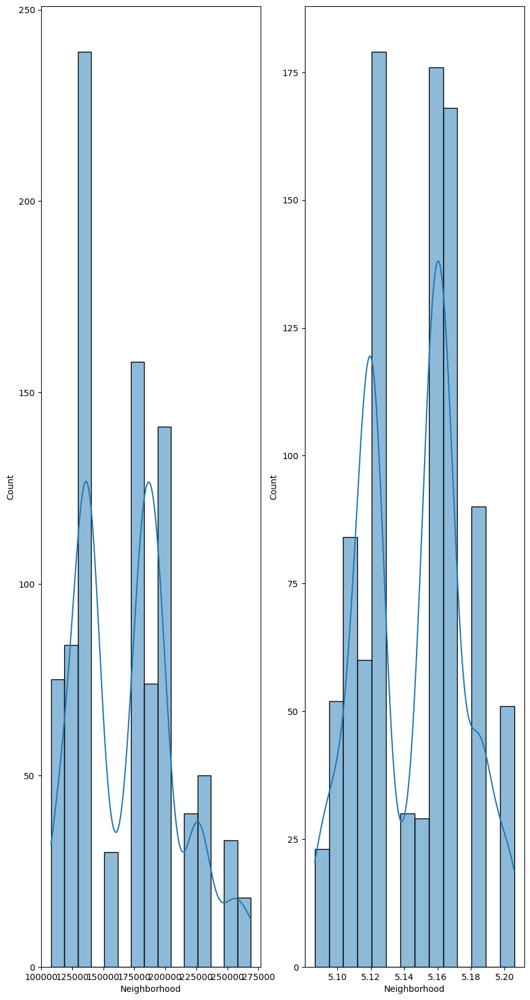

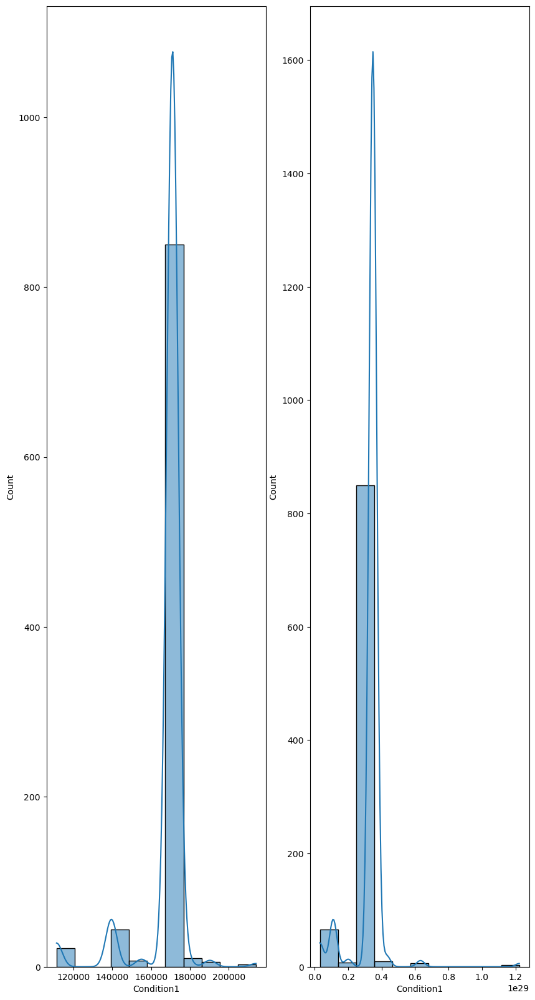

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar multiply
  tmp2 = (x - v) * (fx - fw)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


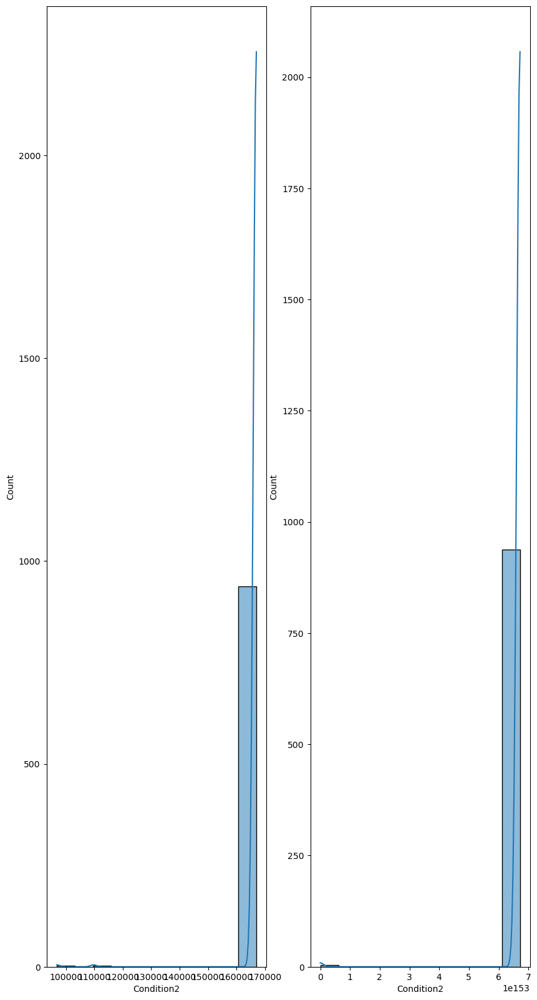

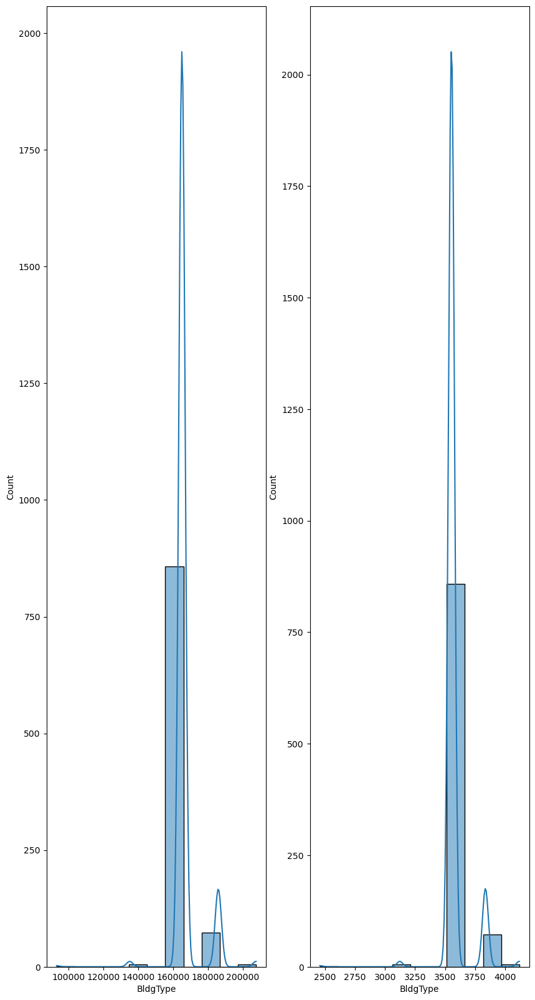

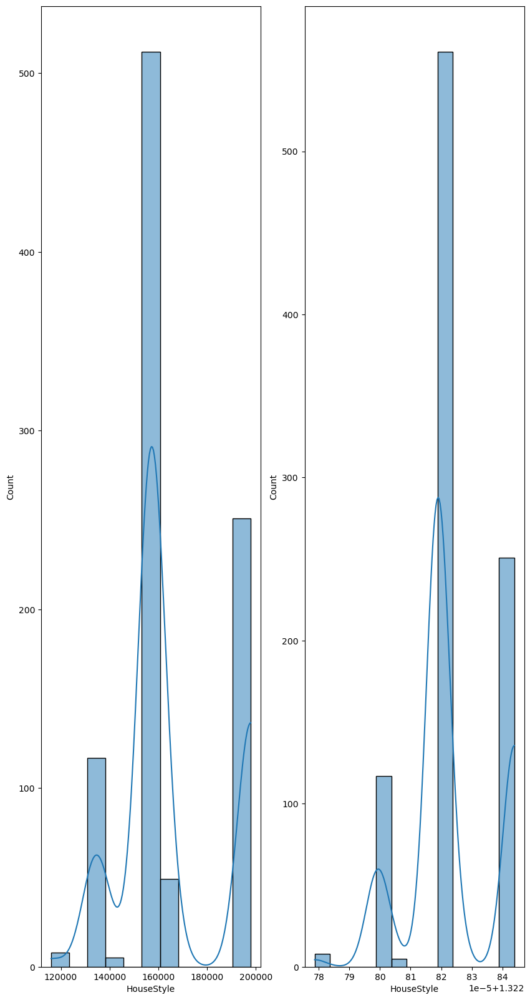

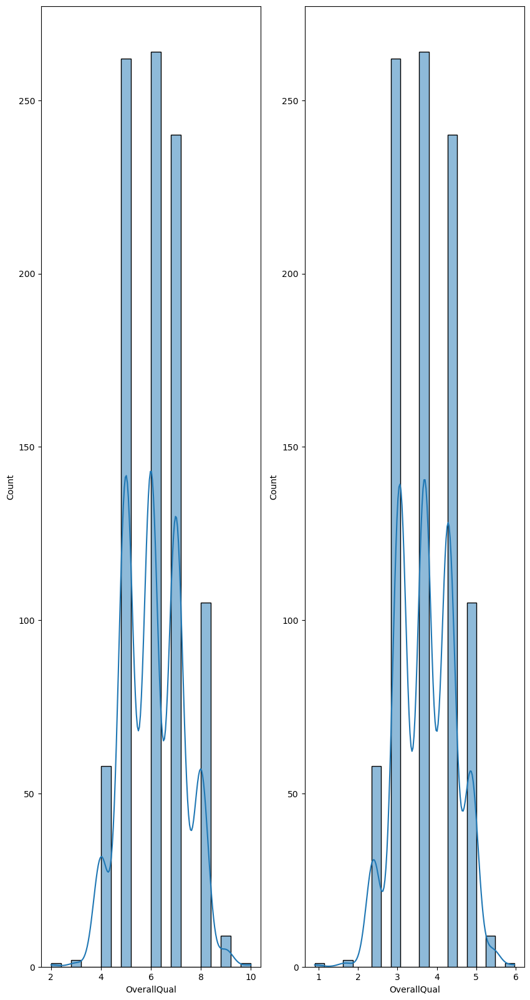

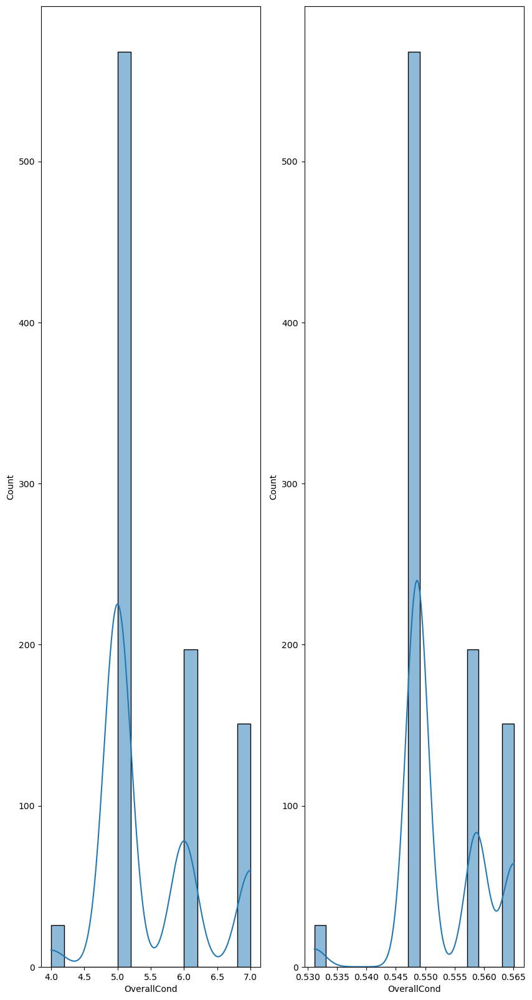

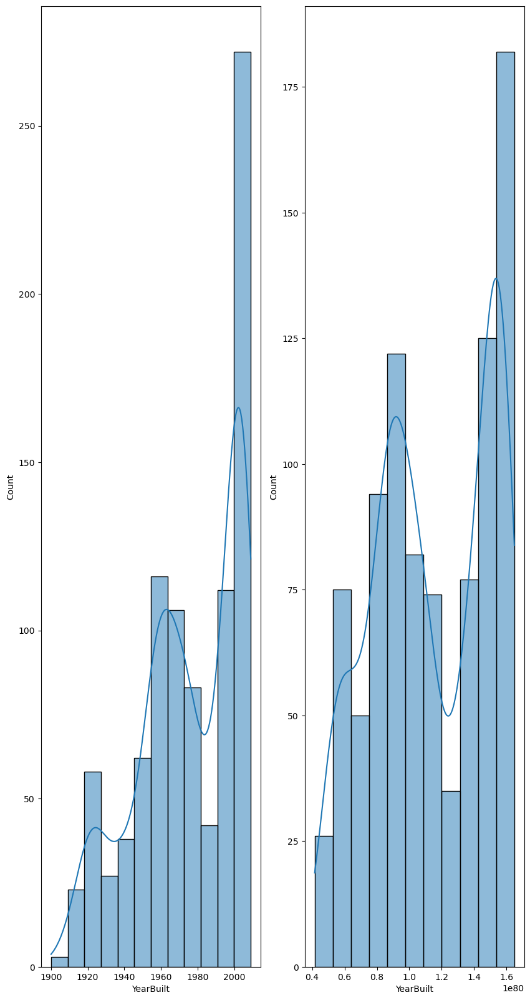

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar multiply
  tmp2 = (x - v) * (fx - fw)


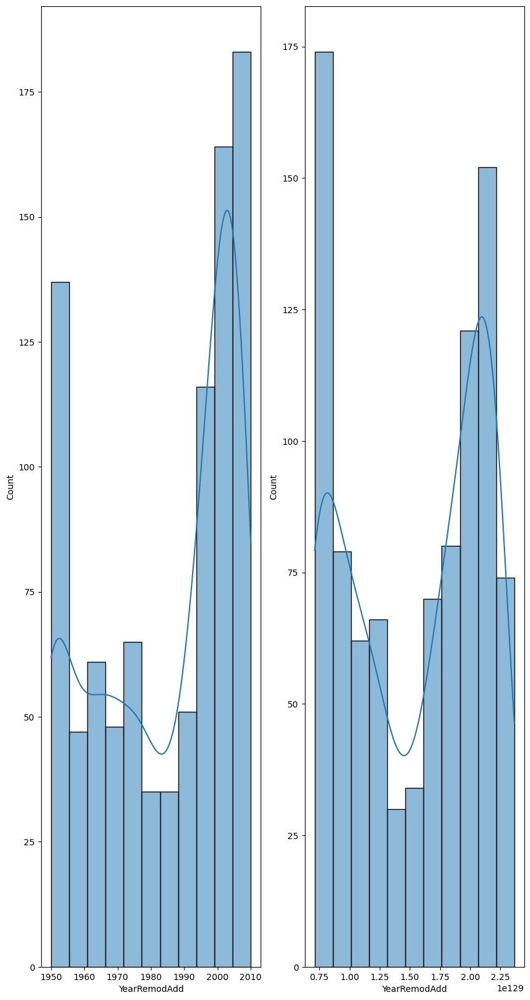

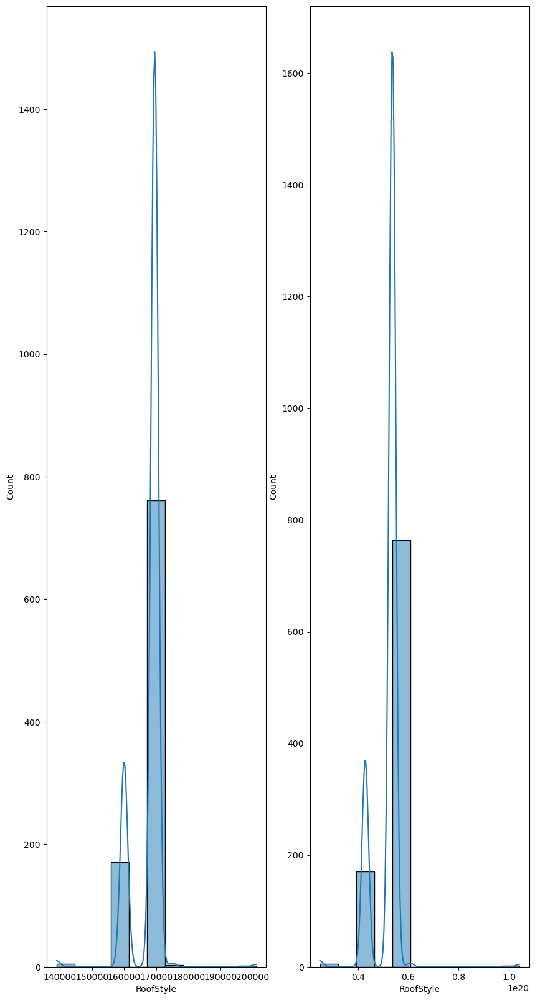

C:\Users\User\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:935: RuntimeWarning: divide by zero encountered in log
  return (lmb - 1) * np.sum(logdata, axis=0) - N/2 * np.log(variance)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2988: RuntimeWarning: invalid value encountered in scalar divide
  w = xb - ((xb - xc) * tmp2 - (xb - xa) * tmp1) / denom
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2487: RuntimeWarning: invalid value encountered in scalar subtract
  tmp1 = (x - w) * (fx - fv)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar subtract
  tmp2 = (x - v) * (fx - fw)


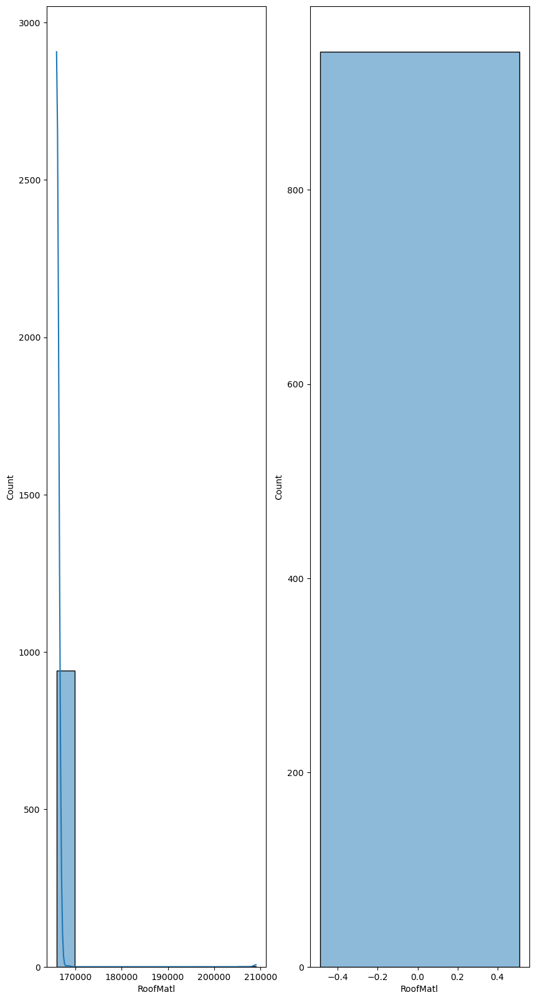

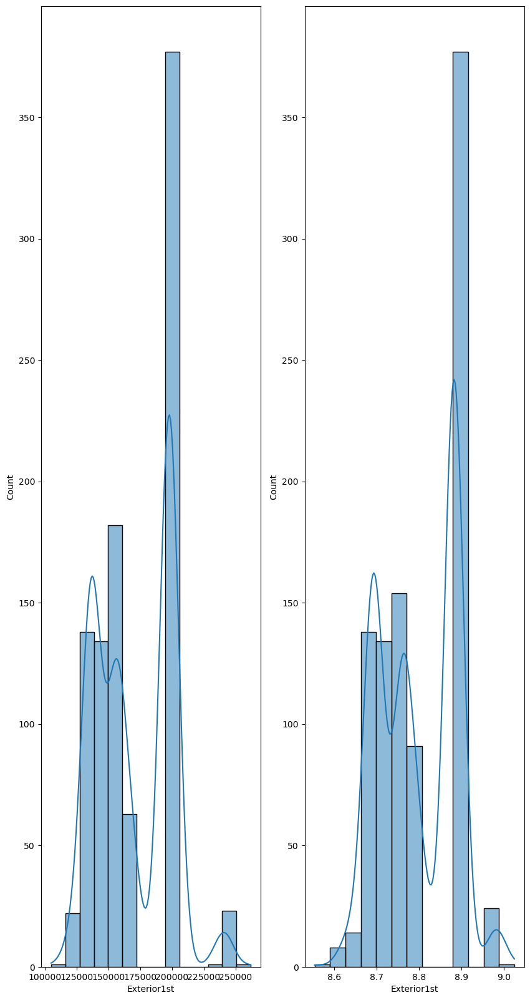

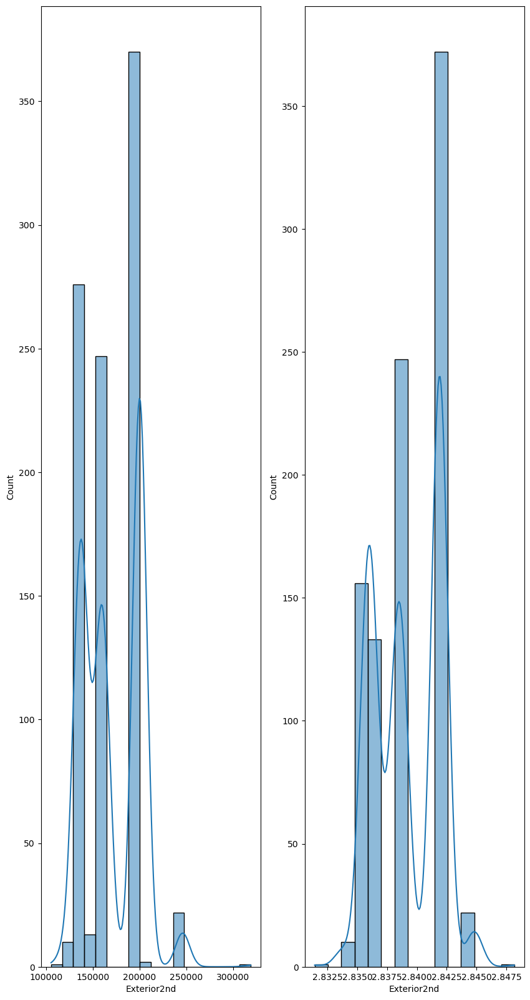

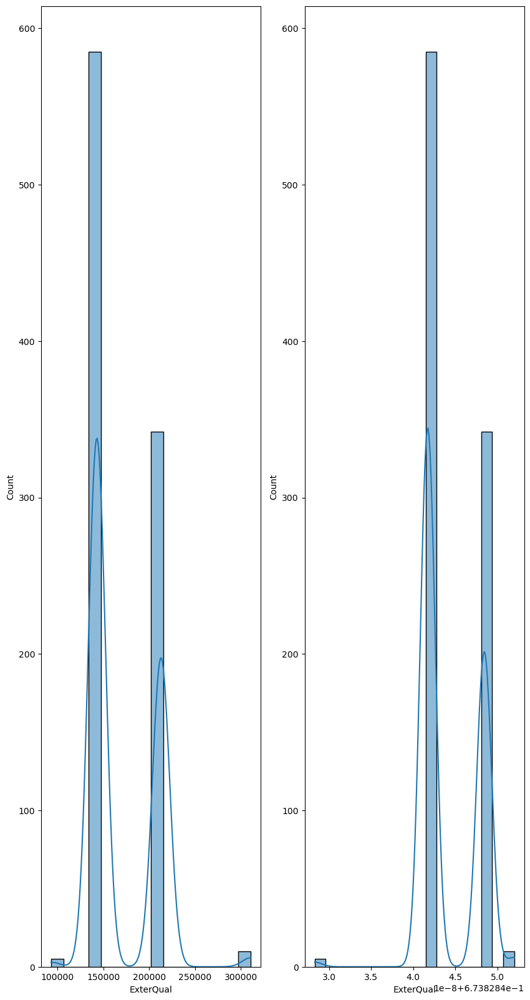

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


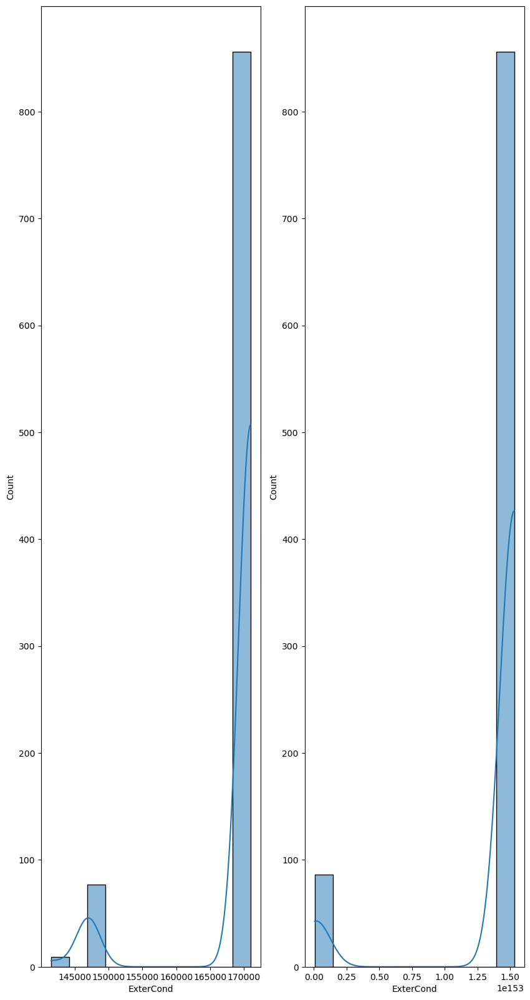

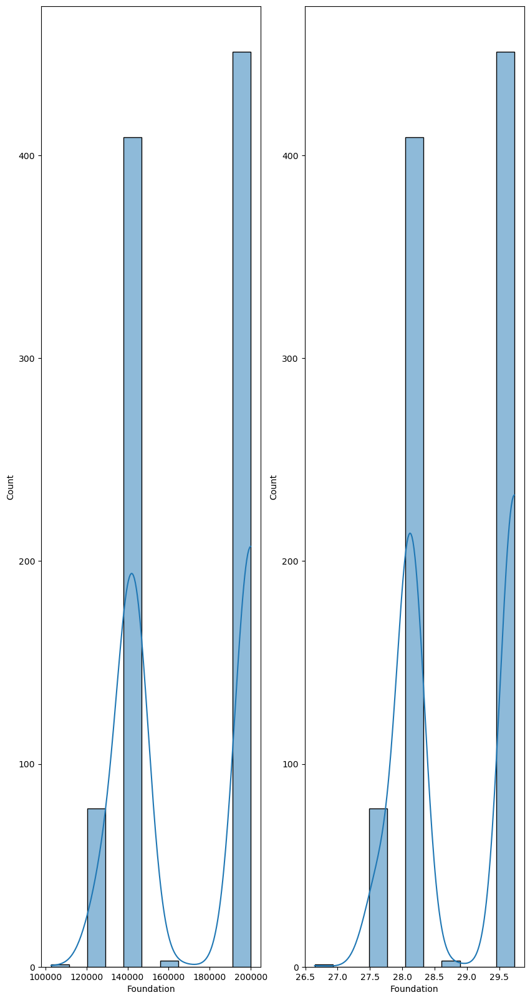

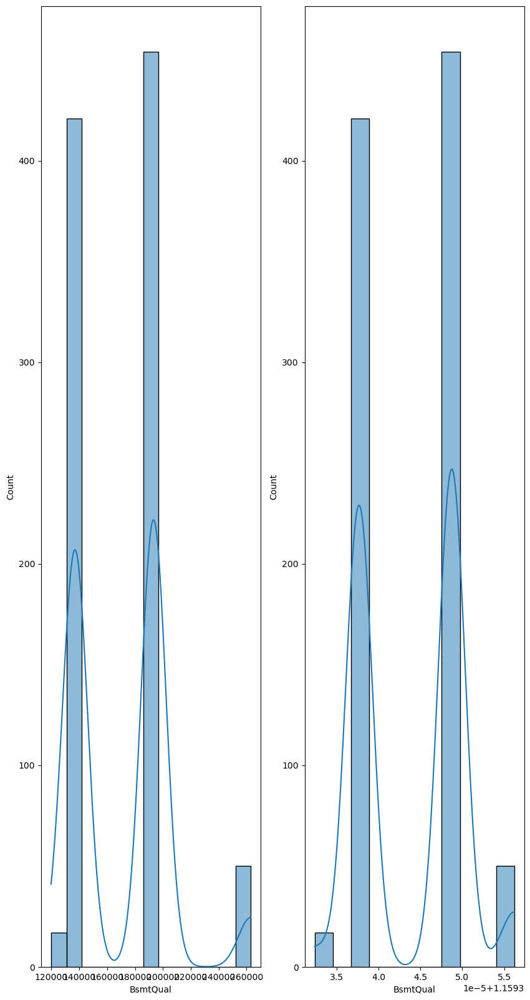

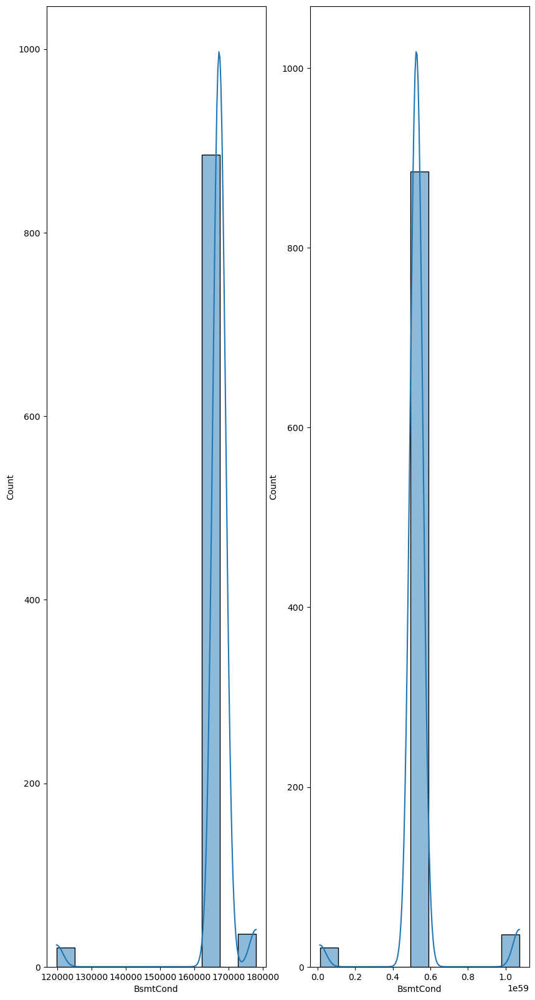

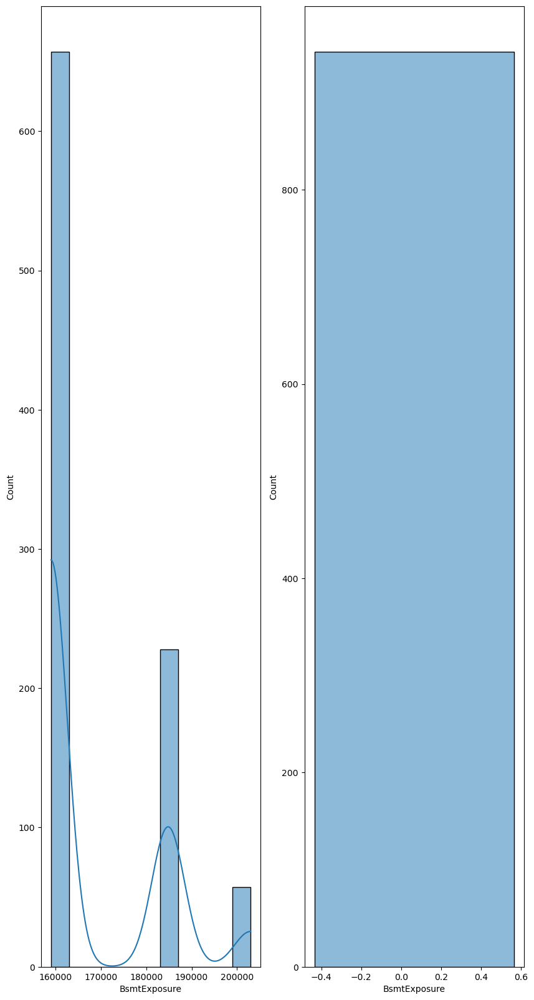

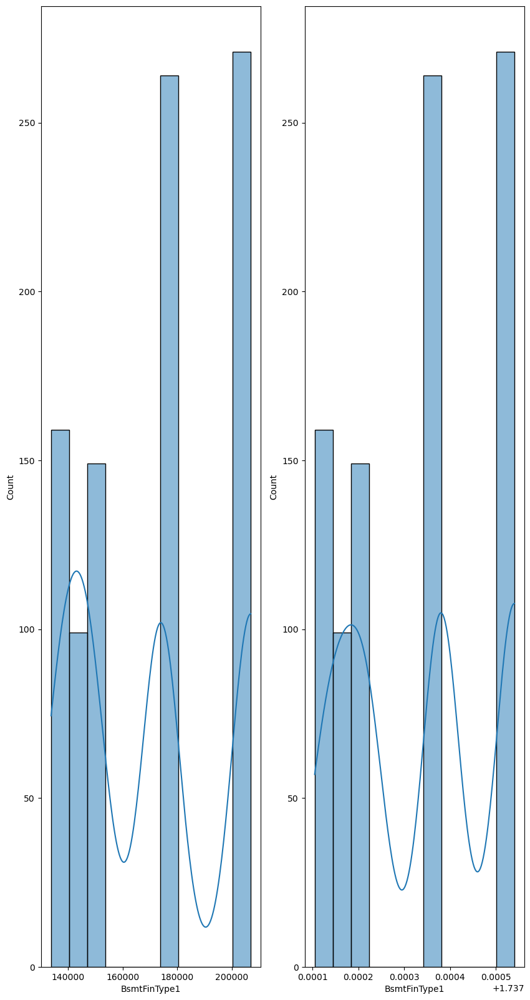

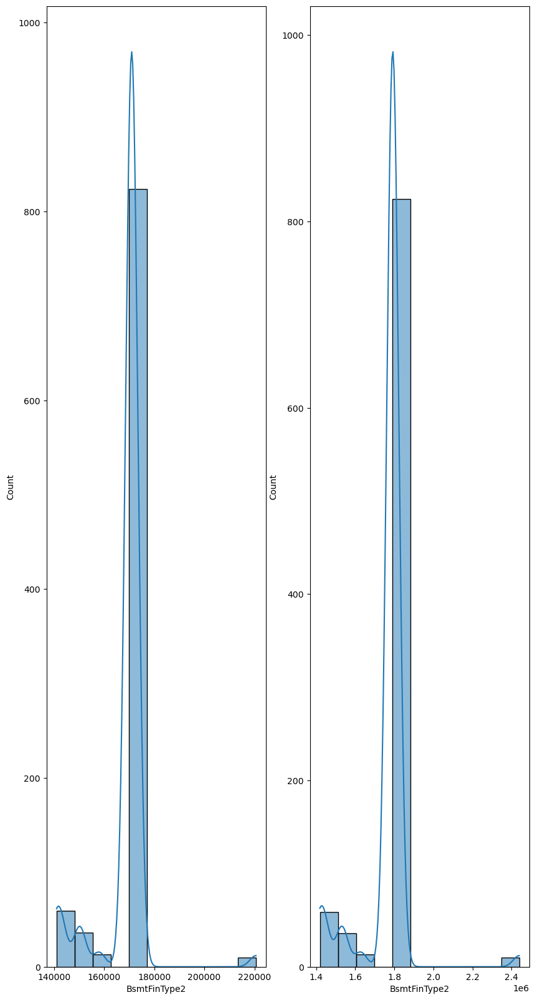

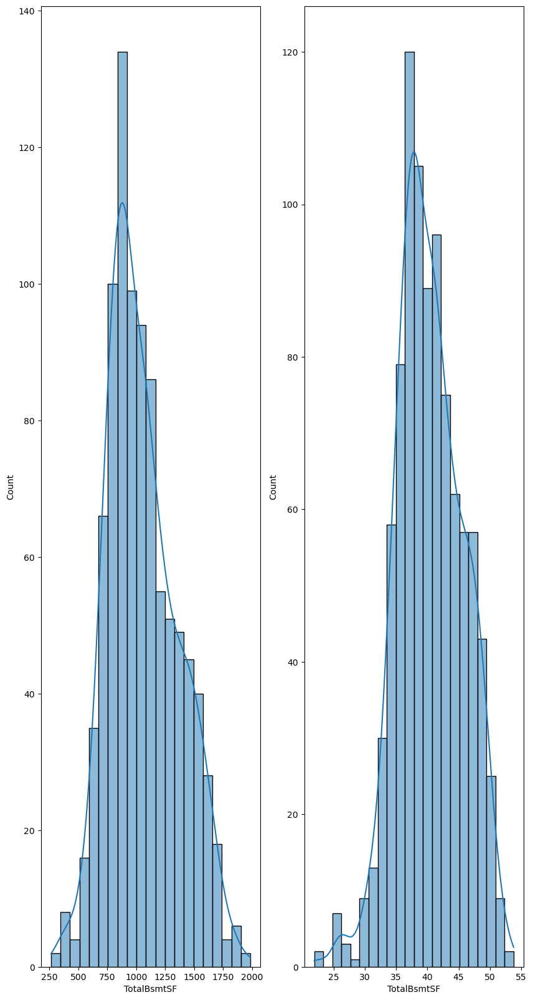

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar multiply
  tmp2 = (x - v) * (fx - fw)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


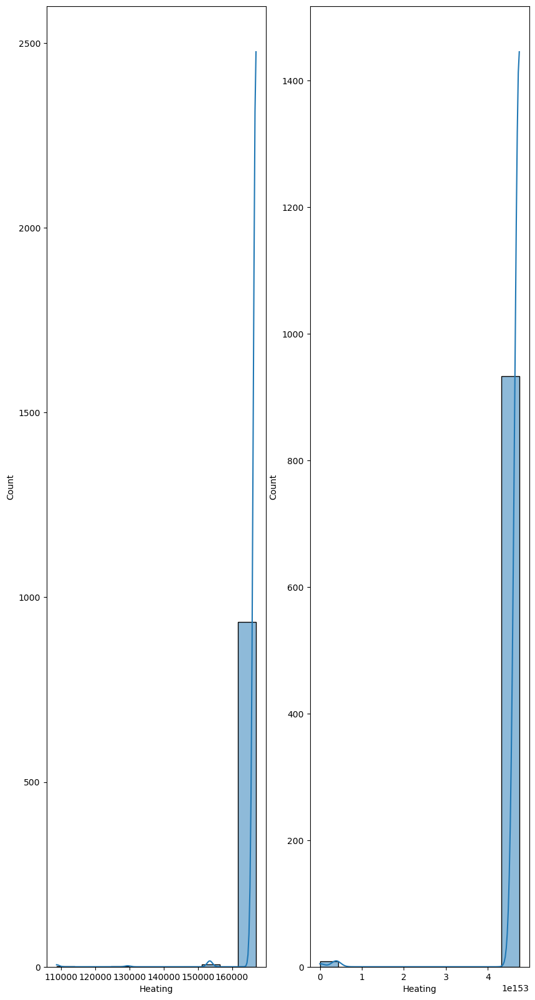

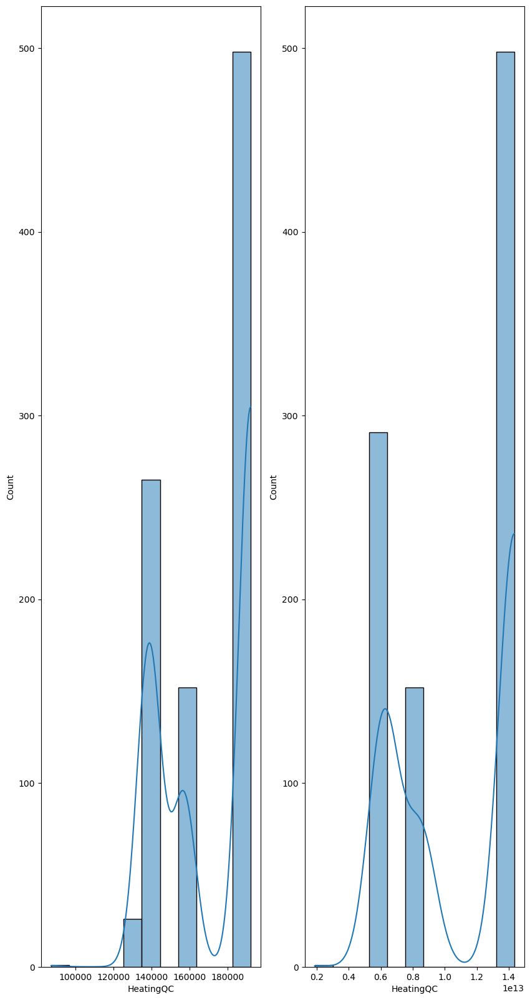

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar multiply
  tmp2 = (x - v) * (fx - fw)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


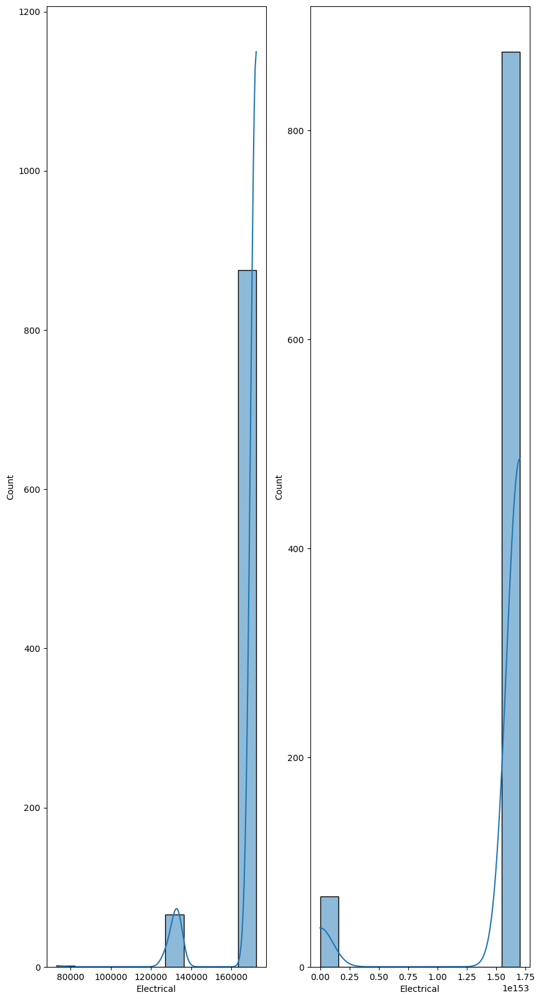

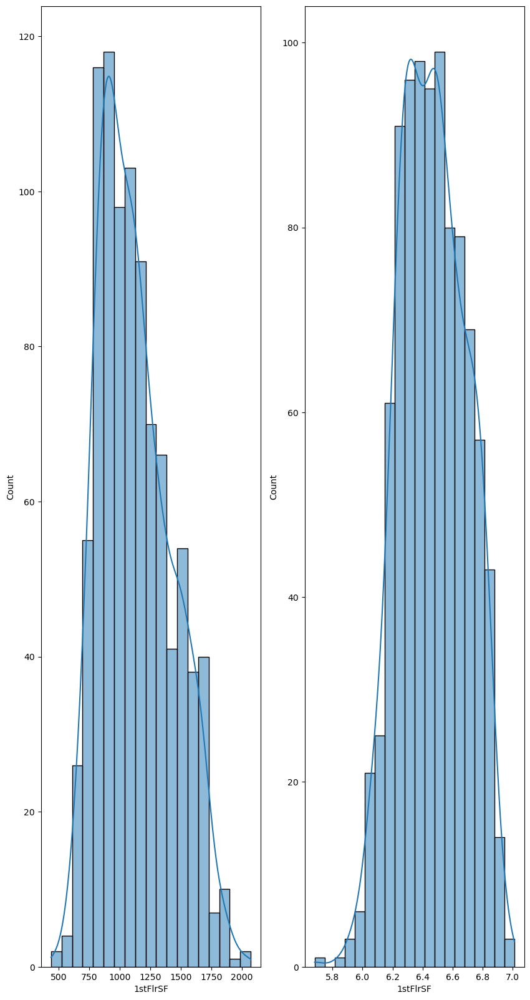

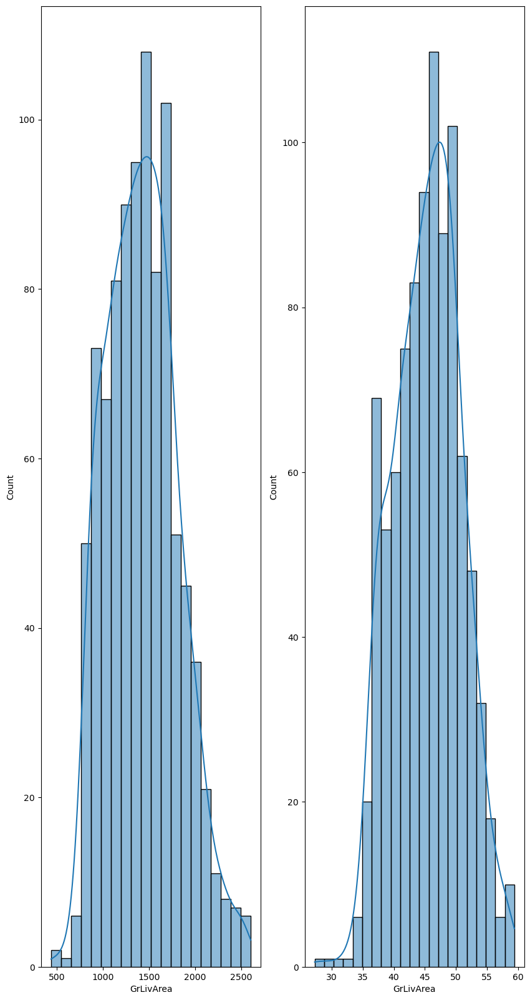

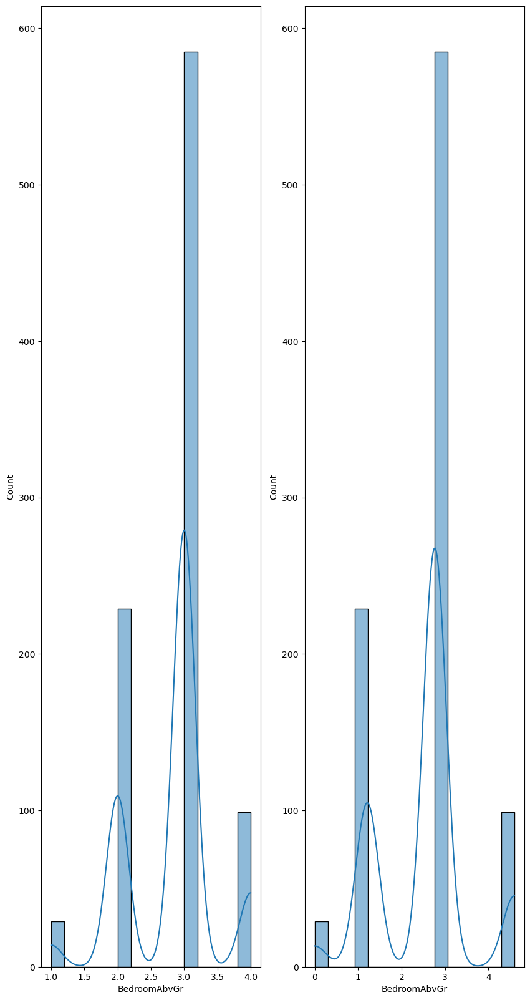

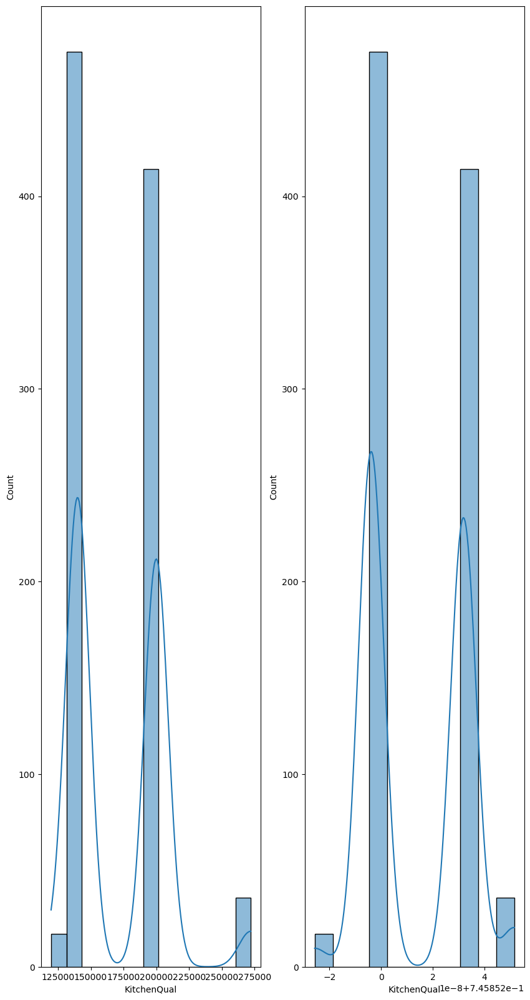

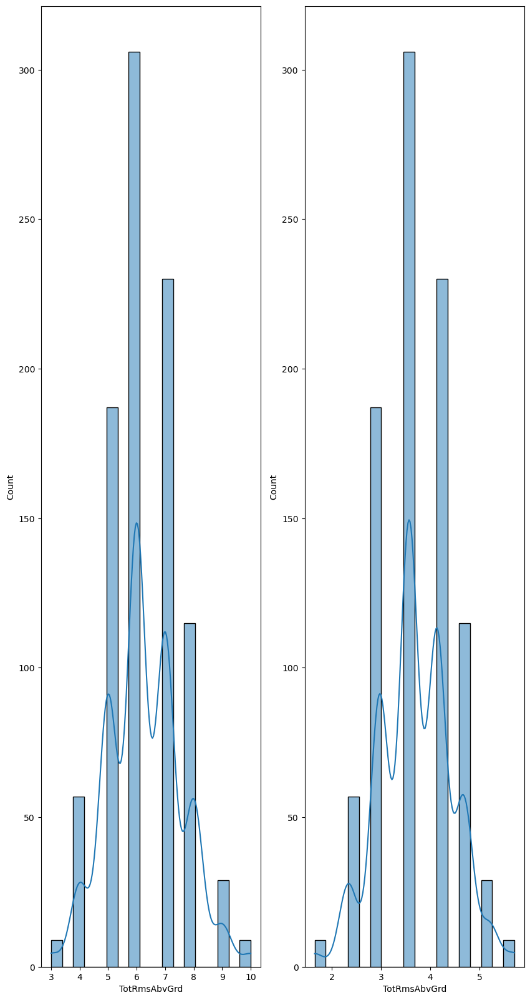

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


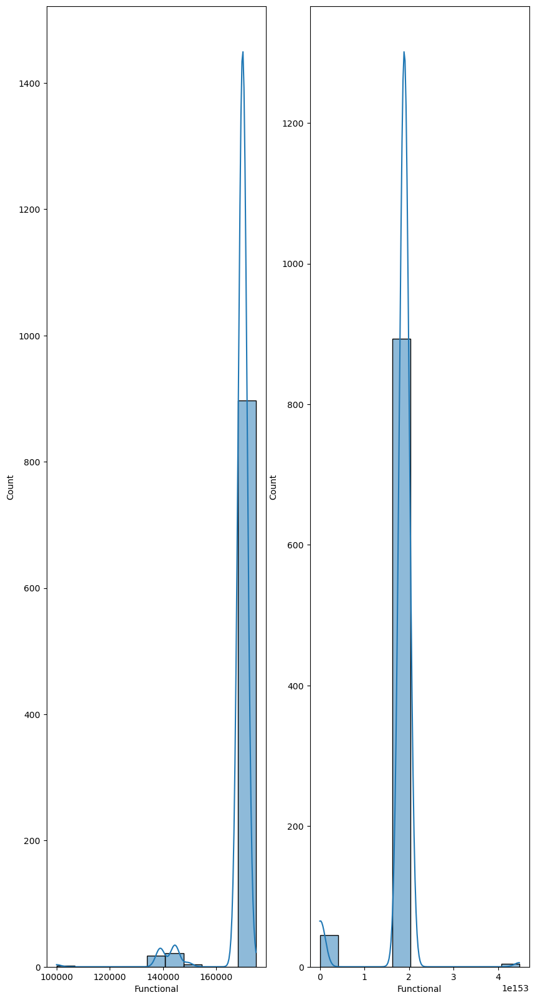

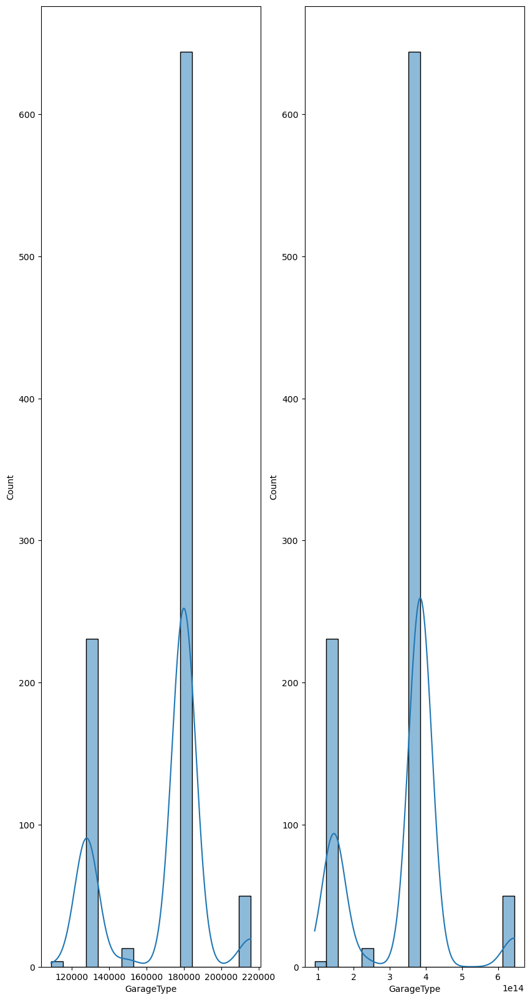

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


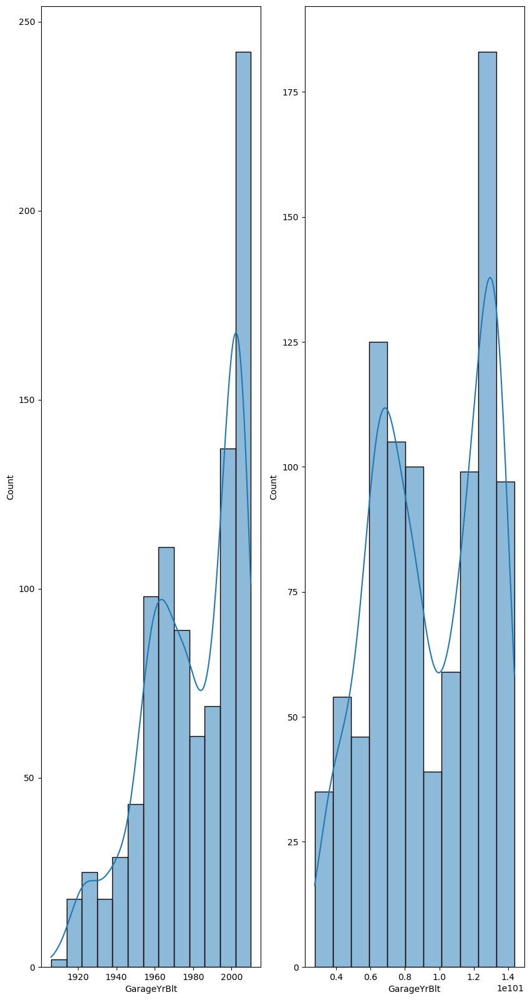

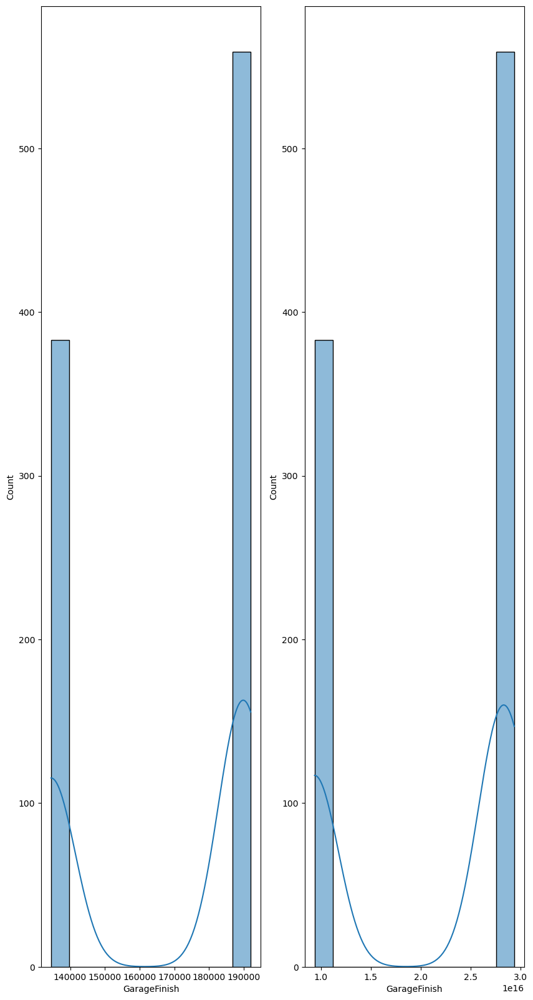

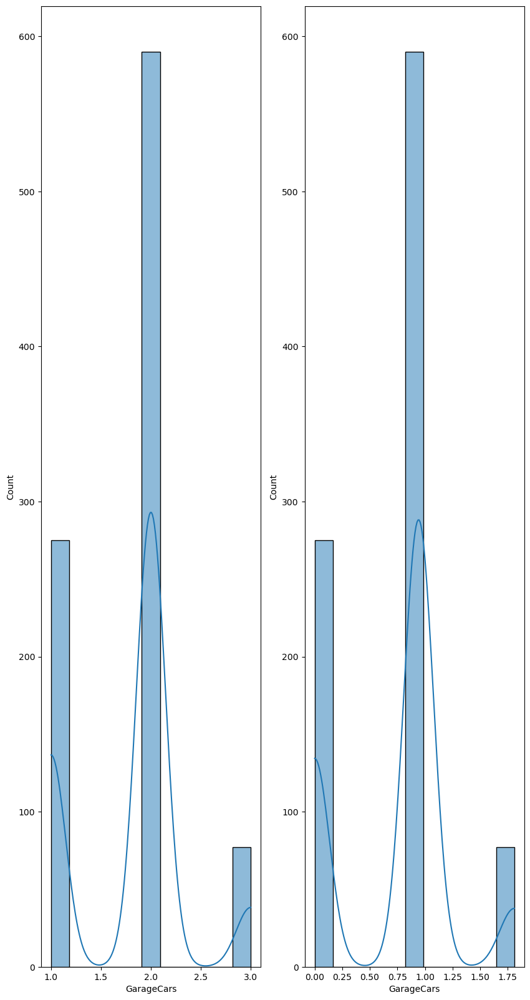

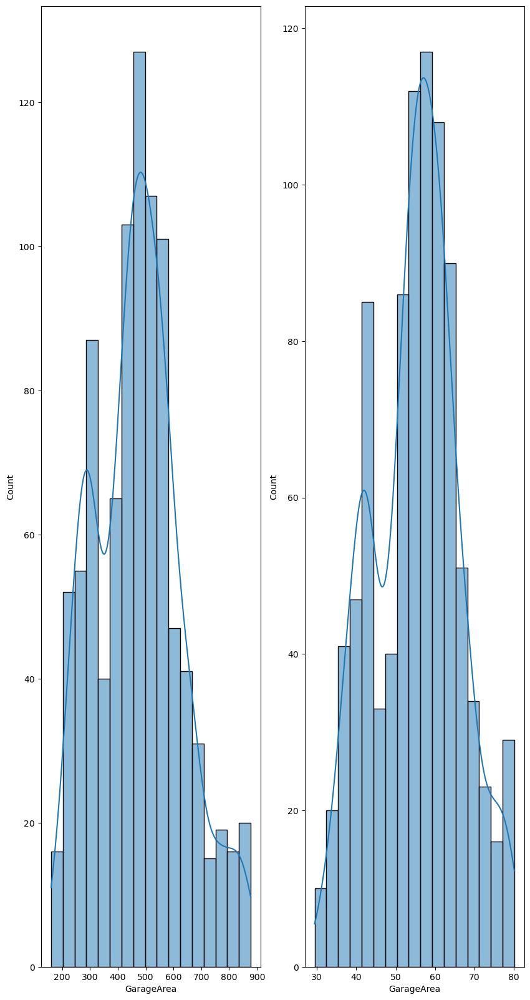

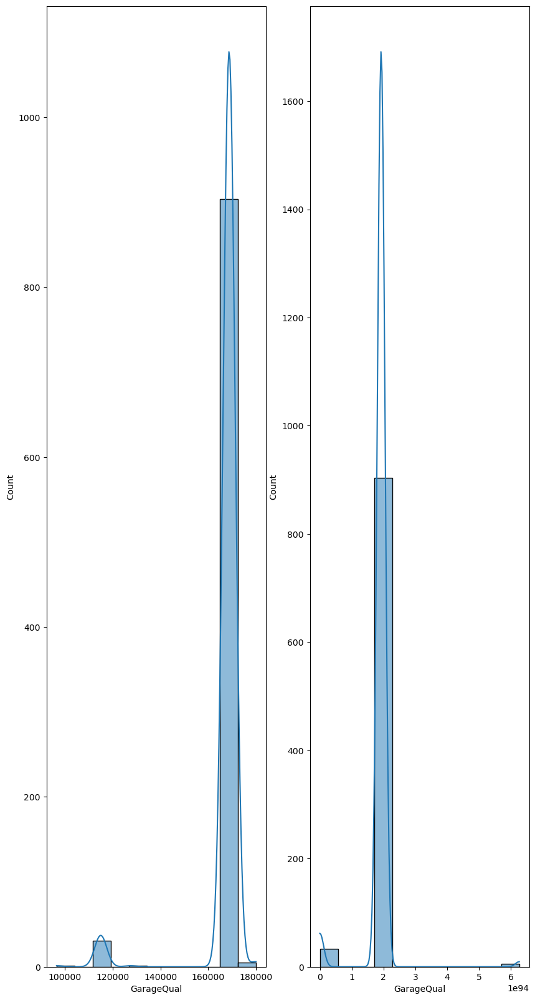

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


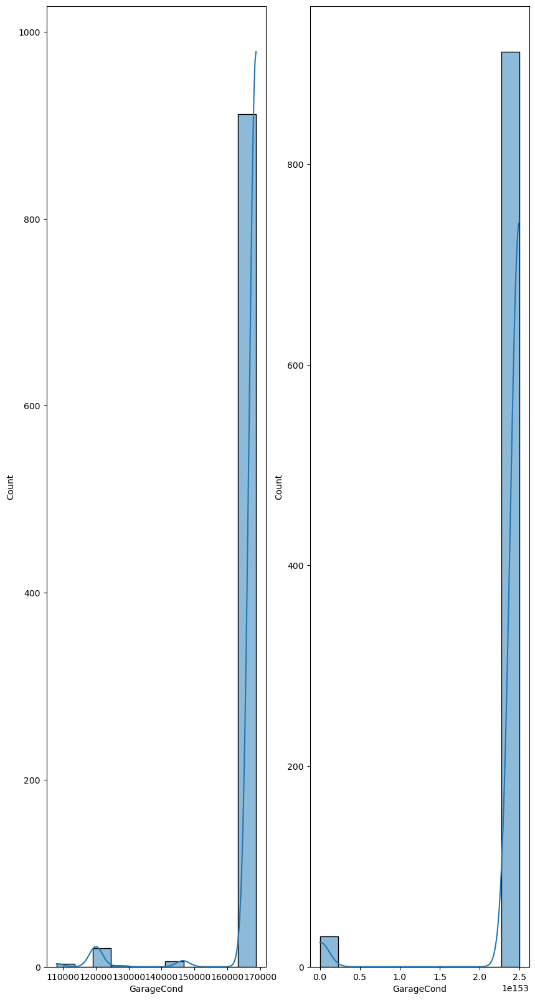

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


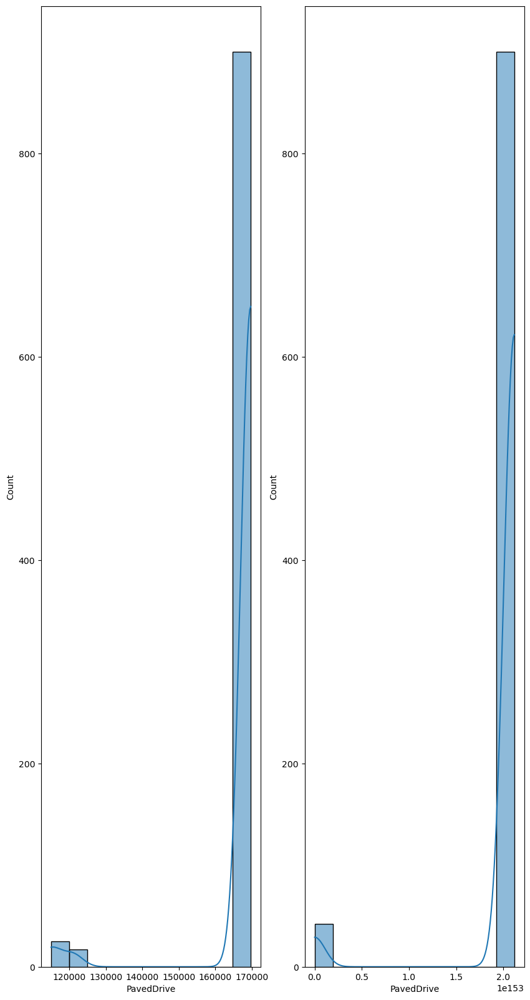

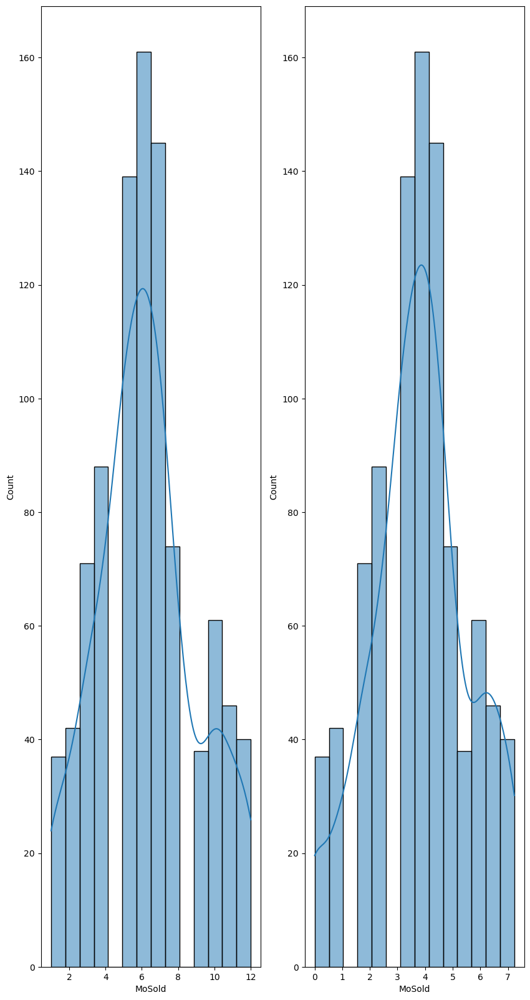

C:\Users\User\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:935: RuntimeWarning: divide by zero encountered in log
  return (lmb - 1) * np.sum(logdata, axis=0) - N/2 * np.log(variance)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2487: RuntimeWarning: invalid value encountered in scalar subtract
  tmp1 = (x - w) * (fx - fv)
C:\Users\User\anaconda3\Lib\site-packages\scipy\optimize\_optimize.py:2488: RuntimeWarning: invalid value encountered in scalar subtract
  tmp2 = (x - v) * (fx - fw)


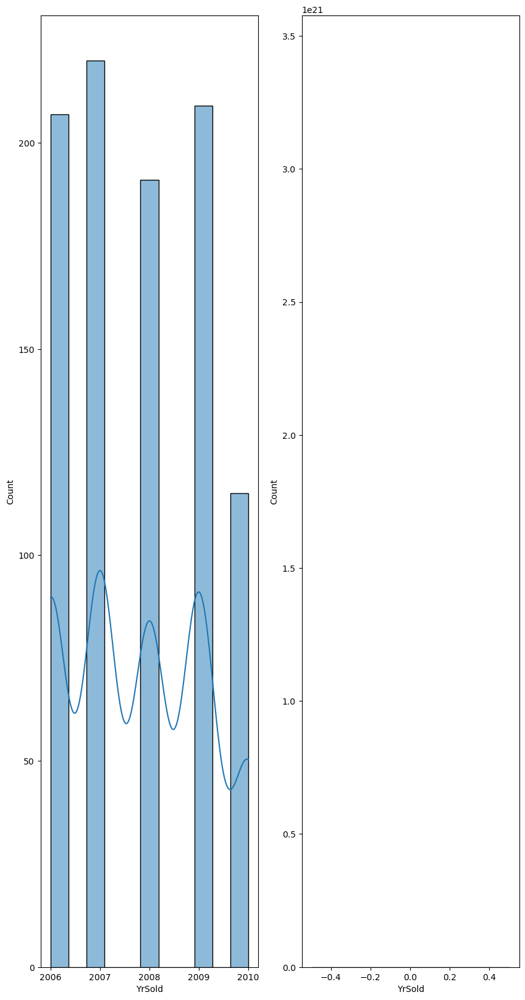

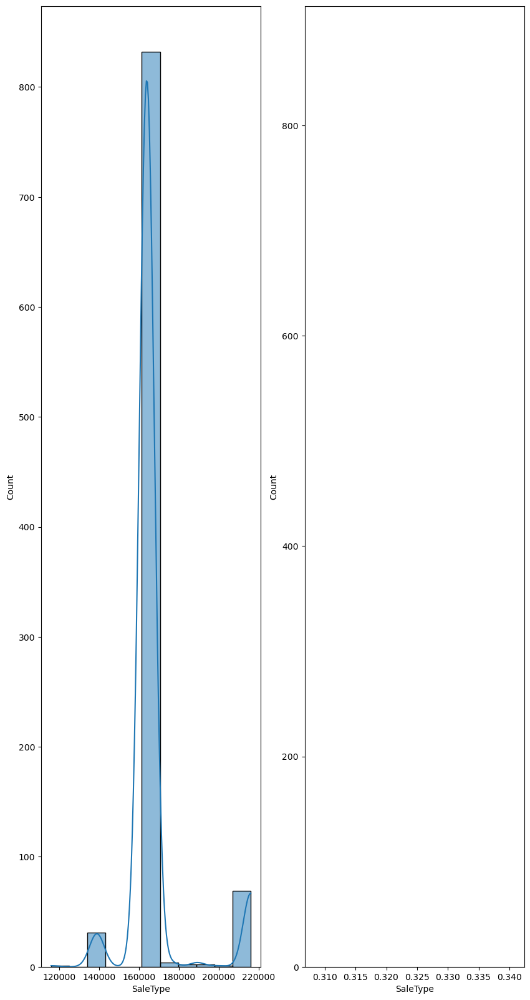

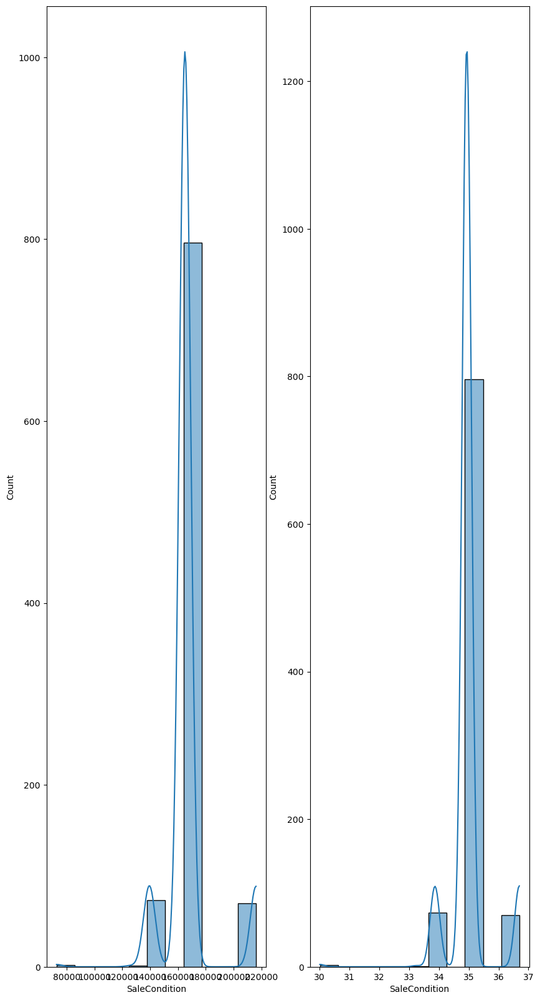

In [26]:
for col in df4.columns:
    
    #tranform the independent Featuress
    if (df4[col]>0).all() and df4[col].nunique()>1 and col!='SalePrice':
        fig,axes=plt.subplots(1,2,figsize=(10,20))
        sns.histplot(df4[col],kde=True,ax=axes[0])
        df4[col],lamda=boxcox(df4[col])
        sns.histplot(df4[col],kde=True,ax=axes[1])
        plt.show()
    elif col!='SalePrice':
        df4[col]=np.log(df4[col]+1)

    

In [27]:
X=df4.drop('SalePrice',axis=1)
Y=df4[['SalePrice']]

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [29]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.20,random_state=42)

In [30]:
ss=StandardScaler()

In [31]:
X_train_scaled=ss.fit_transform(X_train)
X_test_scaled=ss.transform(X_test)

In [32]:
lm=LinearRegression()
lm.fit(X_train_scaled,Y_train)

LinearRegression()

In [35]:
Y_pred=lm.predict(X_test_scaled)

C:\Users\User\AppData\Local\Temp\ipykernel_12860\2300714149.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((Y_test-Y_pred),kde=True)


<Axes: ylabel='Density'>

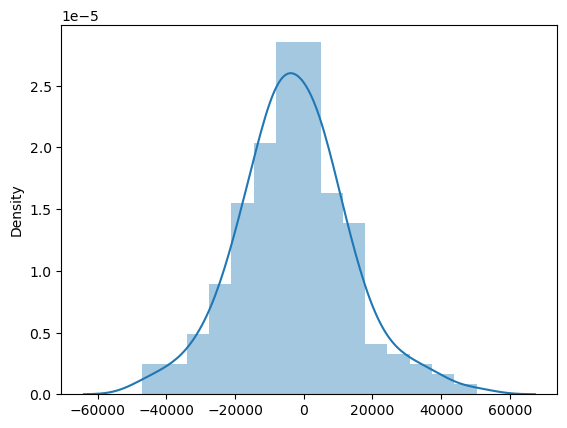

In [40]:
sns.distplot((Y_test-Y_pred),kde=True)

In [36]:
mse=mean_squared_error(Y_test,Y_pred)
r2=r2_score(Y_test,Y_pred)

In [37]:
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 267077003.11738965
R-squared: 0.8906460208034823


In [38]:
# Number of observations and predictors
n = X_test.shape[0]
p = X_test.shape[1]

# Calculate Adjusted R-squared
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
print(adjusted_r2)

0.8406314101632145


When the Adjusted R-squared value is less than the R-squared value, it typically indicates that the additional predictors added to the regression model do not improve the model's fit. In fact, they may even make the model worse. Here's why:

### R-squared
- R-squared measures the proportion of the variance in the dependent variable that is explained by the independent variables.
- It always increases or remains the same when more predictors are added, even if those predictors are not useful.

### Adjusted R-squared
- Adjusted R-squared adjusts the R-squared value based on the number of predictors in the model and the sample size.
- It penalizes the addition of irrelevant predictors by decreasing if the added predictors do not improve the model sufficiently.
- Unlike R-squared, Adjusted R-squared can decrease when unnecessary predictors are included.

### Interpretation
- **Higher R-squared**: Adding more predictors will generally increase the R-squared value, regardless of whether those predictors are significant or not.
- **Lower Adjusted R-squared**: If the Adjusted R-squared value is lower than the R-squared value, it means that the additional predictors are not contributing to a better model and may be introducing noise or unnecessary complexity.

### Example
Suppose you have a regression model with only one predictor, and you add more predictors to the model:
- **R-squared** might increase because it measures how well the model explains the variance in the target variable.
- **Adjusted R-squared** might decrease if the new predictors do not provide substantial explanatory power.

Here's a simple visual representation of the formulas:
\[ \text{R-squared} = 1 - \frac{\text{SS}_{\text{res}}}{\text{SS}_{\text{tot}}} \]
\[ \text{Adjusted R-squared} = 1 - \left( \frac{(1 - R^2) \cdot (n - 1)}{n - p - 1} \right) \]

Where:
- \(\text{SS}_{\text{res}}\) is the residual sum of squares.
- \(\text{SS}_{\text{tot}}\) is the total sum of squares.
- \( n \) is the number of observations.
- \( p \) is the number of predictors.

### Practical Implication
When you observe that Adjusted R-squared is lower than R-squared, it suggests that you should reconsider the predictors included in your model. Removing irrelevant or redundant predictors may lead to a more accurate and simpler model.

If you need further assistance with your regression model or have specific concerns, feel free to ask!

#
#
#
#
#### To report out model accuracy should we use r2 or adjusted r2?

When reporting the accuracy of your regression model, it's generally advisable to use both R-squared (R²) and Adjusted R-squared, as they provide complementary insights:

### R-squared (R²)
- **Purpose**: Measures the proportion of the variance in the dependent variable that is explained by the independent variables.
- **Interpretation**: Indicates how well the model fits the data. A higher R² value signifies a better fit.
- **Use Case**: Useful for a quick overview of the model's explanatory power. However, it doesn't account for the number of predictors in the model.

### Adjusted R-squared
- **Purpose**: Adjusts the R² value based on the number of predictors and the sample size, penalizing for the addition of irrelevant predictors.
- **Interpretation**: Provides a more accurate measure of model performance, particularly when comparing models with different numbers of predictors.
- **Use Case**: More reliable when evaluating models with multiple predictors, as it adjusts for the potential overfitting introduced by adding more predictors.

### Reporting Recommendations
- **Include Both**: Report both R² and Adjusted R² to give a complete picture of your model's performance. R² provides an initial understanding, while Adjusted R² offers a more refined assessment.
- **Contextual Explanation**: Provide context when reporting these metrics. Explain the significance of both values and how they reflect the model's performance.

### Example Explanation
Suppose your model has an R² of 0.89 and an Adjusted R² of 0.87:
- **R² of 0.89**: Indicates that 89% of the variance in the dependent variable is explained by the model.
- **Adjusted R² of 0.87**: Suggests that after accounting for the number of predictors, 87% of the variance is explained, highlighting a strong model fit while adjusting for complexity.

By including both metrics and explaining their relevance, you provide a comprehensive and transparent assessment of your model's performance.

If you need further guidance or specific examples for reporting your model's accuracy, feel free to ask!